# GUC NETW 1003 Kmeans Assginmnet 

Objective: exercise is to learn how to use build and use  kmeans clustering algortrithm    

At the end of this lab you will be able to
> 1. Build and run a K-means algorithm.
> 2. Know how to evalute K-means Algorithm 
> 2. Understand the effect of the parmeters ont he perfromance of the algorithm .
> 3. Understand the effect of distance.

## 1. Wirte K means function 

import required libraries 

In [1]:
import numpy as np, pandas as pd, seaborn as sns, matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.datasets import make_moons

> ### 1.1. Code for the distance function 

write a function to calculate the distance between a set of cluster centroids and all the data points 

Cluster_Distances = GUC_Distance ( Cluster_Centroids, Data_points, Distance_Type) 
* The function shoud be able to handel data points with any number of features and any number of points 
* The function should be able to handle any K number of cluster centroids 
* To inrease speed do that in matrix format using numpy
* This should produce a matrix with rows equal to data points columns equal K 
* You should be able to calculate different types of Distance. In this assginmnet you are required to implement the following two 
    - Ecluidian distance
    - Pearson correlation distance
  

In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_blobs, make_moons

def GUC_Distance(Cluster_Centroids, Data_points, Distance_Type):
    if Distance_Type == "euclidean":
        distances = np.linalg.norm(Data_points[:, np.newaxis, :] - Cluster_Centroids, axis=2)
    elif Distance_Type == "pearson":
        centered_data = Data_points - np.mean(Data_points, axis=0)
        centered_centroids = Cluster_Centroids - np.mean(Cluster_Centroids, axis=0)
        product = np.sum(centered_data[:, np.newaxis, :] * centered_centroids, axis=2)
        data_norm = np.linalg.norm(centered_data, axis=1)
        centroid_norm = np.linalg.norm(centered_centroids, axis=1)
        distances = 1 - product / np.outer(data_norm, centroid_norm)
    else:
        raise ValueError("Invalid Distance_Type. Choose 'euclidean' or 'pearson'.")
    
    return distances

> ### 1.2. Code for K means function 

> Loop until a stopping condition 

> > in the loop do the following 
> > 1. Cluster Assginmnet 
> > > * Use the GUC_Distance to calculate between each cluster head and all the points 
> > > * Find the value and index of the minimum distance  for each row. 
> > > * for each point in the row use the index of the minmum distance to represent the cluster Centroid that this point will belong to.
> > > * Calculate and record the mean square distance for each cluster  
> > > * Use the mean square distances to calculate a stopping condition (e.g the sum of mean distances)
> > 2. Updtate Centroids  
> > > * Update the value for the cluster heads by calculating the mean value for the points in each cluster 
> > >  * Calculate the Cluster Metric (Distortion Function)
> > > > a number indicating the how good the clusters are . An example cluster metric is the  (sum of squared error between each point and its cluster center) 

In [16]:
def GUC_Kmean(Data_points, Number_of_Clusters, Distance_Type, tolerance=1e-4):
    
    if isinstance(Data_points, pd.DataFrame):
        Data_points = Data_points.values

    feature_ranges = np.ptp(Data_points, axis=0)
    cluster_heads = np.zeros((Number_of_Clusters, Data_points.shape[1]))

    for i in range(Data_points.shape[1]):
        min_val = np.min(Data_points[:, i])
        feature_range = feature_ranges[i]
        cluster_heads[:, i] = np.random.uniform(min_val, min_val + feature_range, size=Number_of_Clusters)

    prev_cluster_heads = np.copy(cluster_heads)

    while True:
        cluster_distances = GUC_Distance(cluster_heads, Data_points, Distance_Type)
        assigned_clusters = np.argmin(cluster_distances, axis=1)

        mean_square_distances = np.zeros(Number_of_Clusters)

        # Move the line outside the loop
        cluster_points = [Data_points[assigned_clusters == k] for k in range(Number_of_Clusters)]

        for k in range(Number_of_Clusters):
            mean_square_distances[k] = np.mean(np.sum((cluster_points[k] - cluster_heads[k])**2, axis=1))

        if np.max(np.abs(cluster_heads - prev_cluster_heads)) < tolerance:
            break

        prev_cluster_heads = np.copy(cluster_heads)

        for k in range(Number_of_Clusters):
            cluster_heads[k] = np.mean(Data_points[assigned_clusters == k], axis=0)

    Final_Cluster_Distance = GUC_Distance(cluster_heads, Data_points, Distance_Type)
    Cluster_Metric = np.sum(mean_square_distances)

    return Final_Cluster_Distance, Cluster_Metric, assigned_clusters


## 2. Display Results 

* below is a an example fuction that displayes Clusters in 2D 

* You need to change the function so that is can display an n dimension data in the form of pairs of subplot 2D figures 

* The function is a helper function that is originaly be found in 
https://www.coursera.org/learn/ibm-unsupervised-learning/


In [4]:
import numpy as np, pandas as pd, seaborn as sns, matplotlib.pyplot as plt

> #### 2.1. helper Display function 

In [39]:


def display_cluster_multi_dim(X, km=[], num_clusters=0, color_palette=None):
    alpha = 0.5  
    s = 20

    if num_clusters == 0:
        print("Please provide the number of clusters (num_clusters > 0) to display clusters.")
    else:
        num_dimensions = X.shape[1]
        if num_dimensions == 2:
            fig, ax = plt.subplots(figsize=(8, 8))

            assigned_clusters_index = 2 if len(km) > 2 else 1

            for i in range(num_clusters):
                color = color_palette[i % len(color_palette)] if color_palette else 'brgcmyk'
                ax.scatter(X[km[assigned_clusters_index] == i, 0],
                           X[km[assigned_clusters_index] == i, 1],
                           c=color, alpha=alpha, s=s)
            ax.set_xlabel('Dimension 1')
            ax.set_ylabel('Dimension 2')
        else:
            fig, axes = plt.subplots(num_dimensions - 1, num_dimensions - 1, figsize=(15, 15))
            assigned_clusters_index = 2 if len(km) > 2 else 1

            for dim1 in range(num_dimensions - 1):
                for dim2 in range(dim1 + 1, num_dimensions):
                    ax = axes[dim1, dim2 - 1]
                    for i in range(num_clusters):
                        color = color_palette[i % len(color_palette)] if color_palette else 'brgcmyk'
                        ax.scatter(X[km[assigned_clusters_index] == i, dim1],
                                   X[km[assigned_clusters_index] == i, dim2],
                                   c=color, alpha=alpha, s=s)
                    ax.set_xlabel(f'Dimension {dim1 + 1}')
                    ax.set_ylabel(f'Dimension {dim2 + 1}')

            plt.tight_layout()

        plt.show()




> #### 2.2. Example 1 : Circular Data Gen and display 

* below is an example of how to use the funciton 
  *  prepare the figure size and background 
   > * this part can be replaced by a number of subplots 
  
  * Produce a data set that represent the x and y o coordinates of a circle 
   > * this part can be replaced by data that you import froma file 
  
  * Data is displayed 
   > * to display the data only it is assumed that the number of clusters is zero which is the default of the fuction 

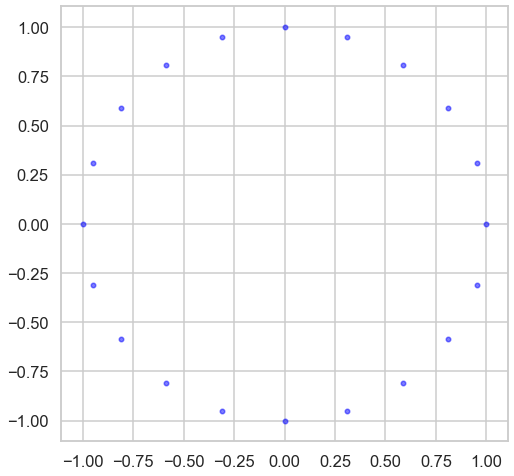

In [5]:
# prepare the figure sise and background 
# this part can be replaced by a number of subplots 
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")
# Produce a data set that represent the x and y o coordinates of a circle 
# this part can be replaced by data that you import froma file 
angle = np.linspace(0,2*np.pi,20, endpoint = False)
X = np.append([np.cos(angle)],[np.sin(angle)],0).transpose()
# Data is displayed 
# to display the data only it is assumed that the number of clusters is zero which is the default of the fuction 
display_cluster(X)

> #### 2.3. Example 2 : Multi blob Data Gen and display 

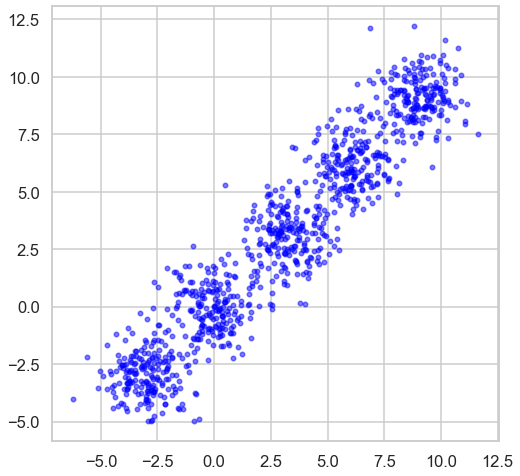

In [6]:
n_samples = 1000
n_bins = 4  
centers = [(-3, -3), (0, 0), (3, 3), (6, 6), (9,9)]
X, y = make_blobs(n_samples=n_samples, n_features=2, cluster_std=1.0,
                  centers=centers, shuffle=False, random_state=42)
display_cluster(X)

#### 2.3. Example 3 : moons Data Gen and display 

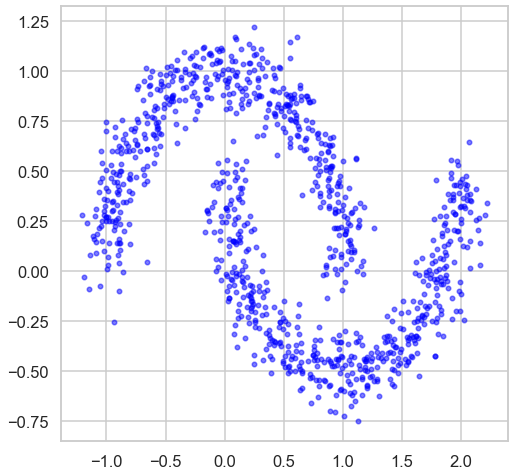

In [18]:
n_samples = 1000
X, y = noisy_moons = make_moons(n_samples=n_samples, noise= .1)
display_cluster(X)

## 3. Testing the GUC_Kmean function on Simple 2D
1. Apply the GUC_Kmean fucntion to 2D Data provided by example 1, Example 2 and Example 3
2. Try a varing number of cluster centriods that range from 2 to 10 clusters on each set 
3. Display your results.
4. plot the Cluster perfromance Metric versus the number of clusters
4. Change the distance function and repeat the above steps 

 ## THIS IS EXAMPLE 1 BY USING EUCLIDEAN DISTANCE

/var/folders/t2/xlvk3_8d6bq8g5hggghj0l940000gn/T/ipykernel_1281/2449504459.py:16: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(X[km[assigned_clusters_index] == i, 0],


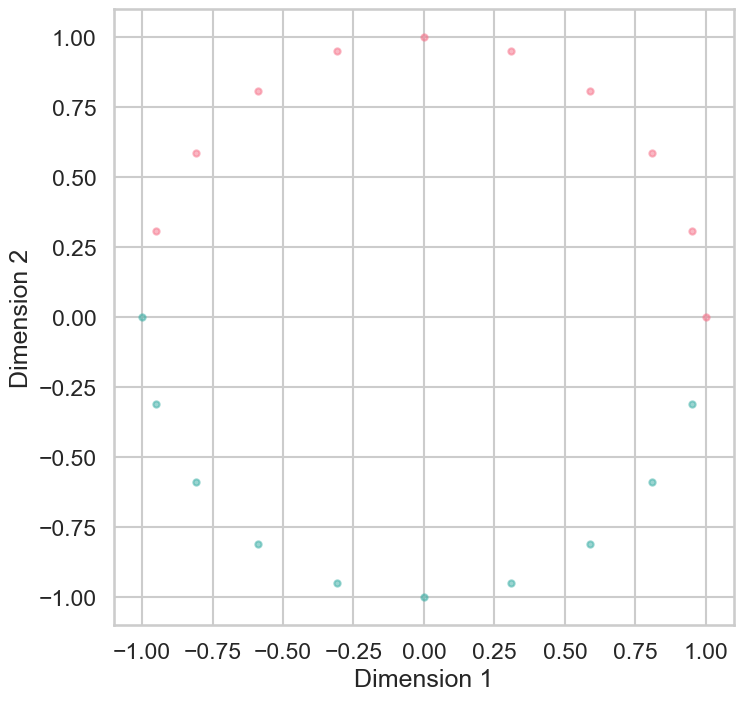

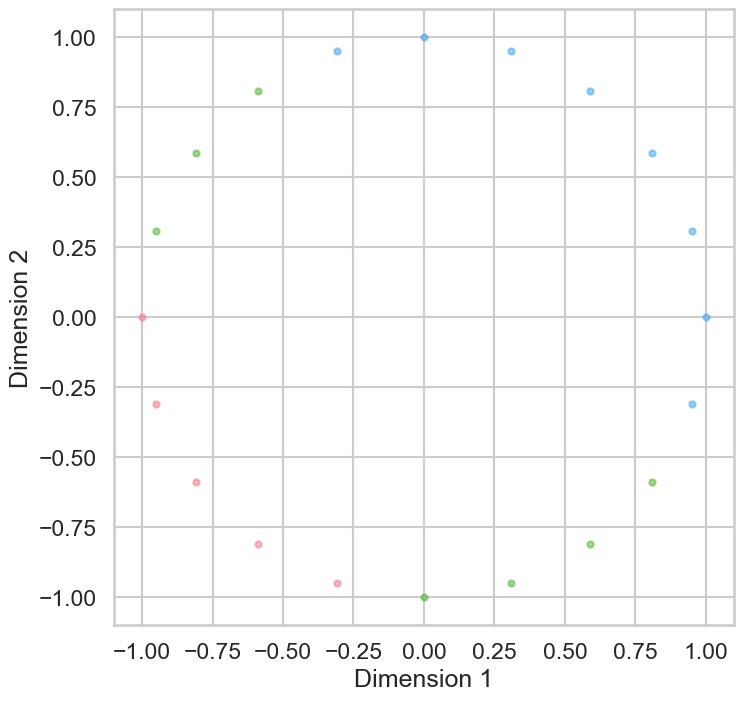

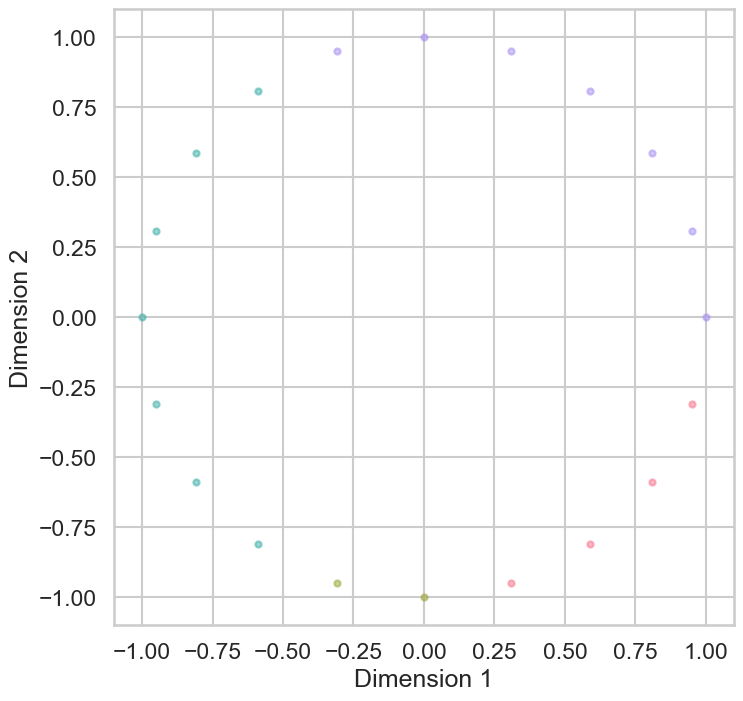

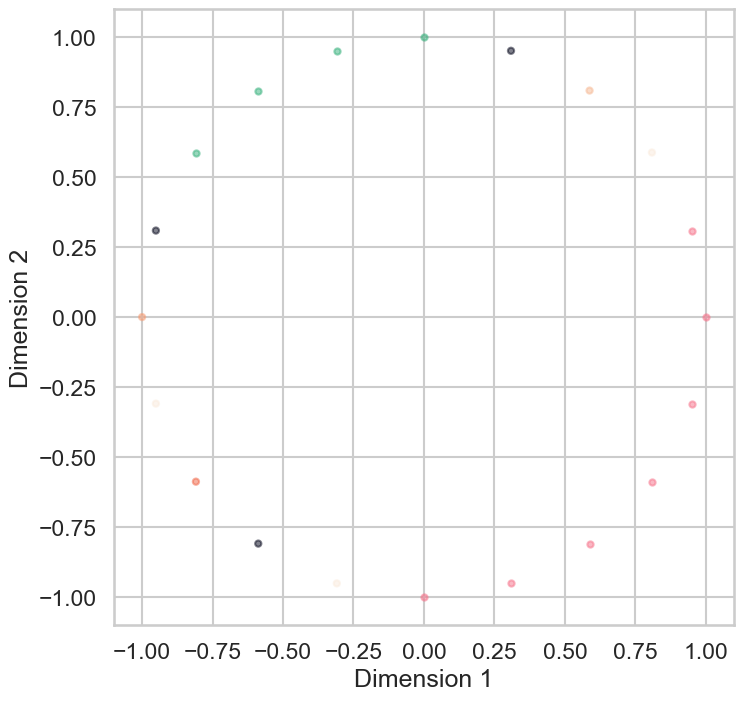

/Users/maria/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/maria/anaconda3/lib/python3.11/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


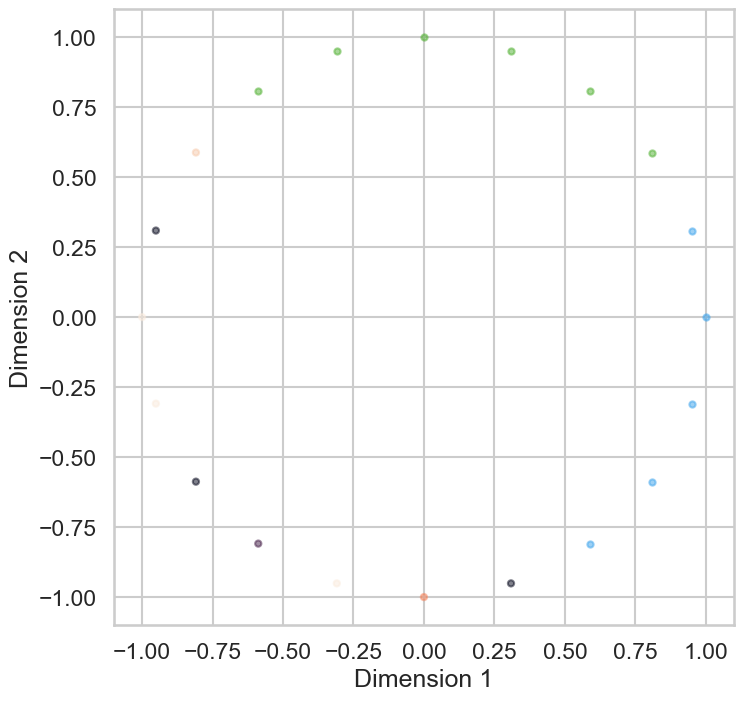

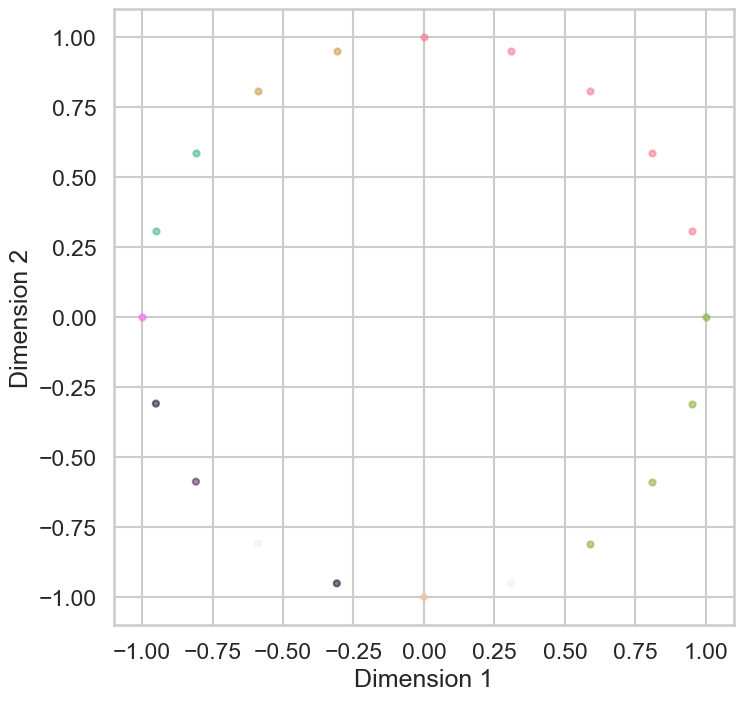

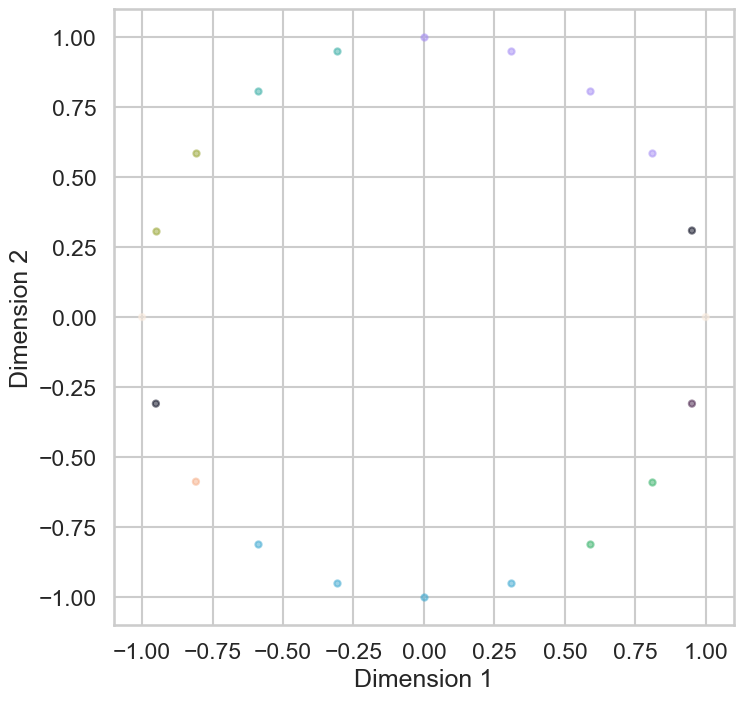

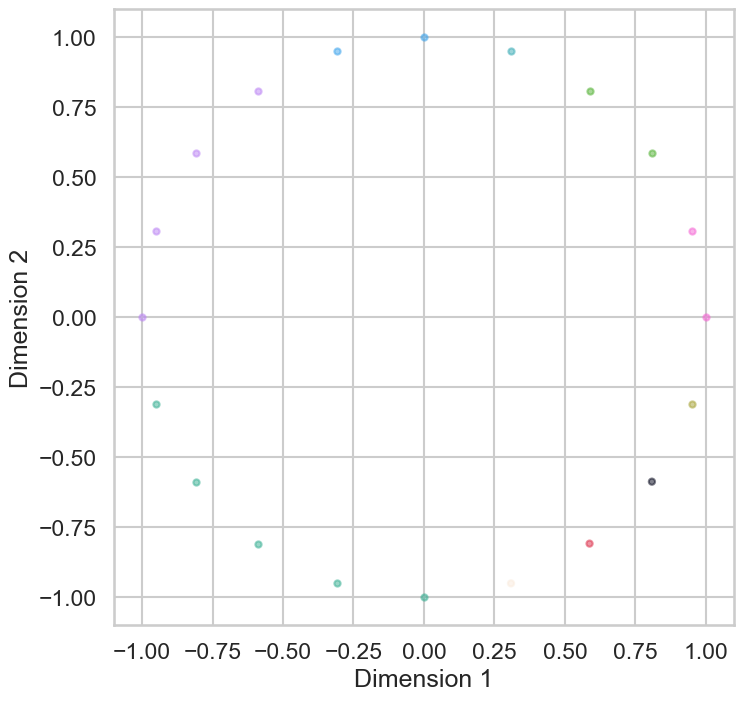

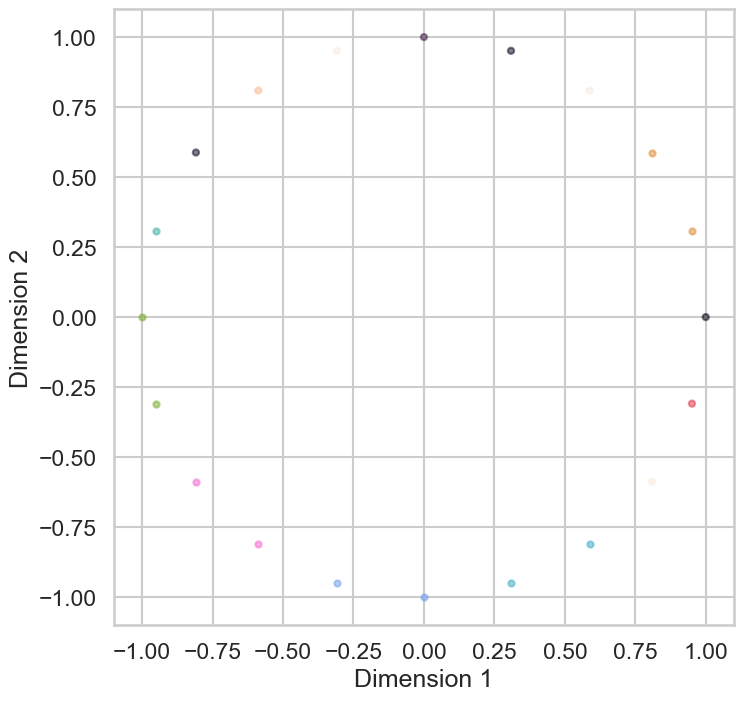

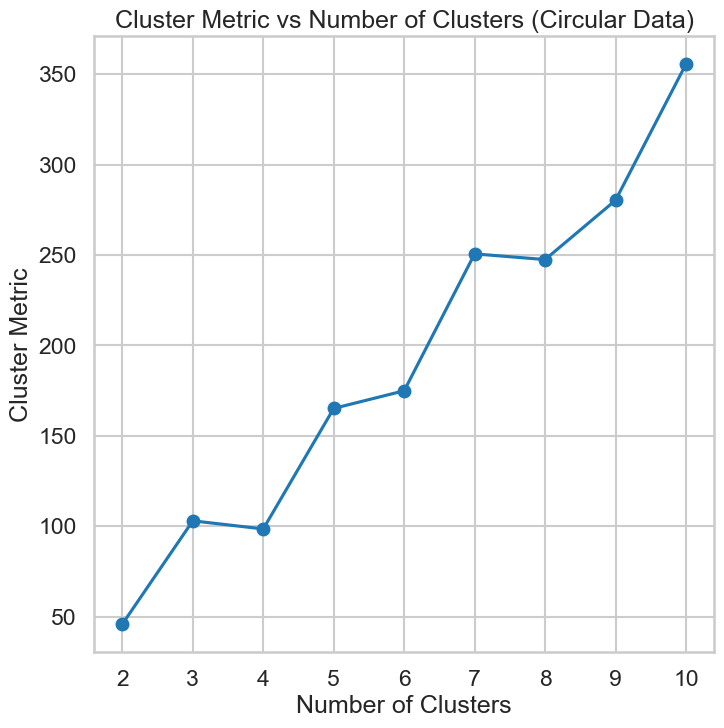

In [45]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_blobs, make_moons

# Varying number of clusters from 2 to 10
num_clusters_range = range(2, 11)

# Example 1: Circular Data
plt.rcParams['figure.figsize'] = [8, 8]
sns.set_style("whitegrid")
sns.set_context("talk")

angle = np.linspace(0, 2*np.pi, 20, endpoint=False)
X_circle = np.append([np.cos(angle)], [np.sin(angle)], 0).transpose()
cluster_metrics_circle = []

for k in num_clusters_range:
    result_circle = GUC_Kmean(X_circle, Number_of_Clusters=k, Distance_Type='euclidean')
    cluster_metrics_circle.append(np.sum(result_circle[0]**2))

    # Display and plot (Note: For 2D data only)
    if X_circle.shape[1] == 2:
        color_palette = sns.color_palette("husl", n_colors=k)  # Use a different color palette
        display_cluster_multi_dim(X_circle, km=result_circle, num_clusters=k, color_palette=color_palette)

# Plot Cluster Metric versus Number of Clusters
plt.figure()
plt.plot(num_clusters_range, cluster_metrics_circle, marker='o')
plt.title('Cluster Metric vs Number of Clusters (Circular Data)')
plt.xlabel('Number of Clusters')
plt.ylabel('Cluster Metric')
plt.show()


## THIS IS EXAMPLE 1 BY USING PEARSON DISTANCE

/var/folders/t2/xlvk3_8d6bq8g5hggghj0l940000gn/T/ipykernel_1281/2449504459.py:16: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(X[km[assigned_clusters_index] == i, 0],


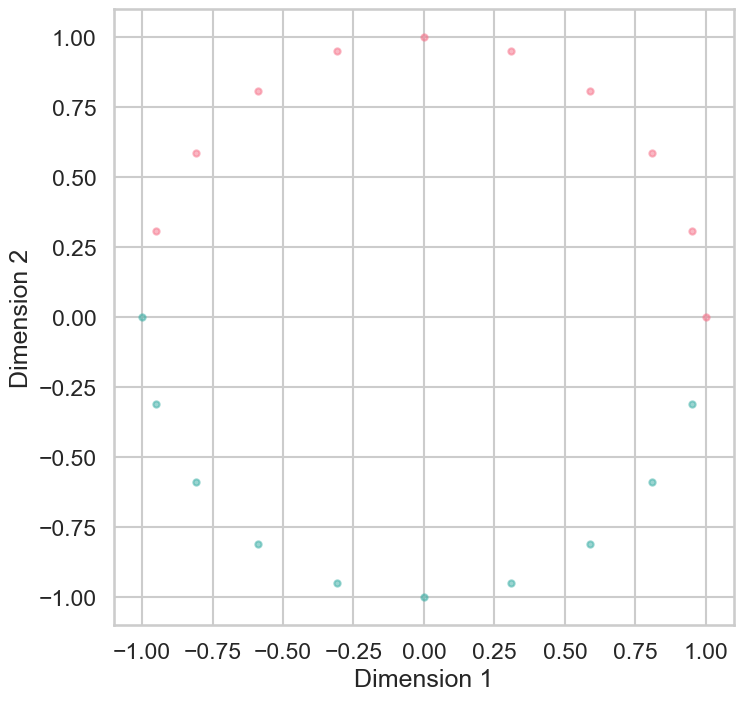

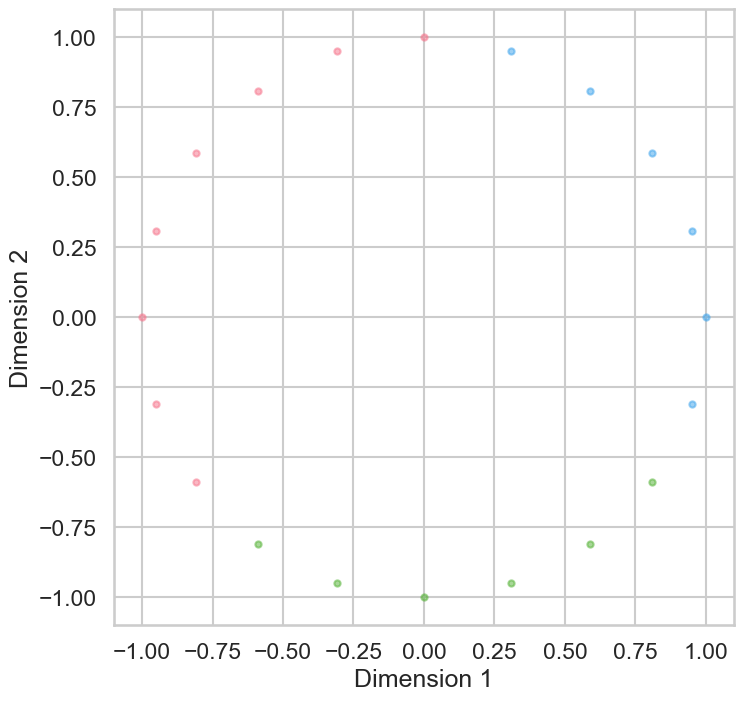

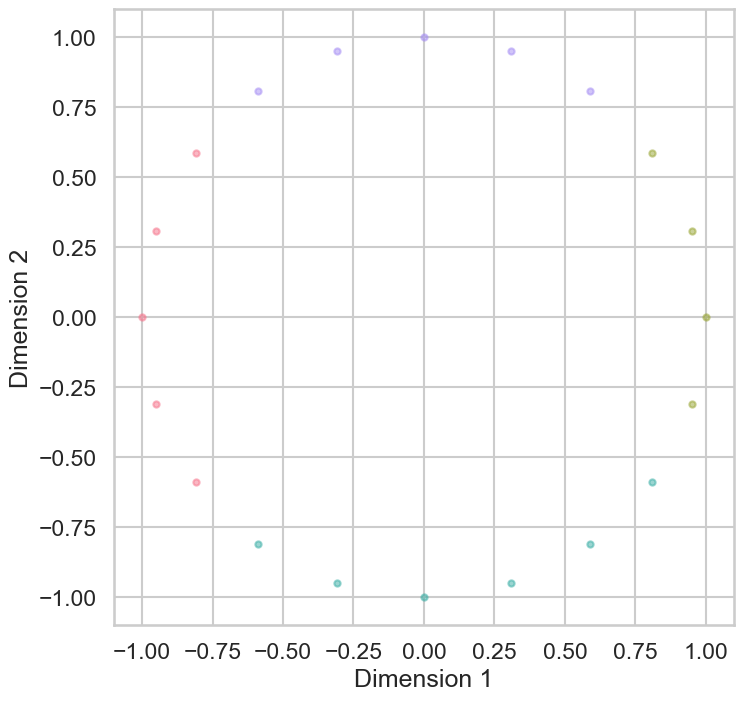

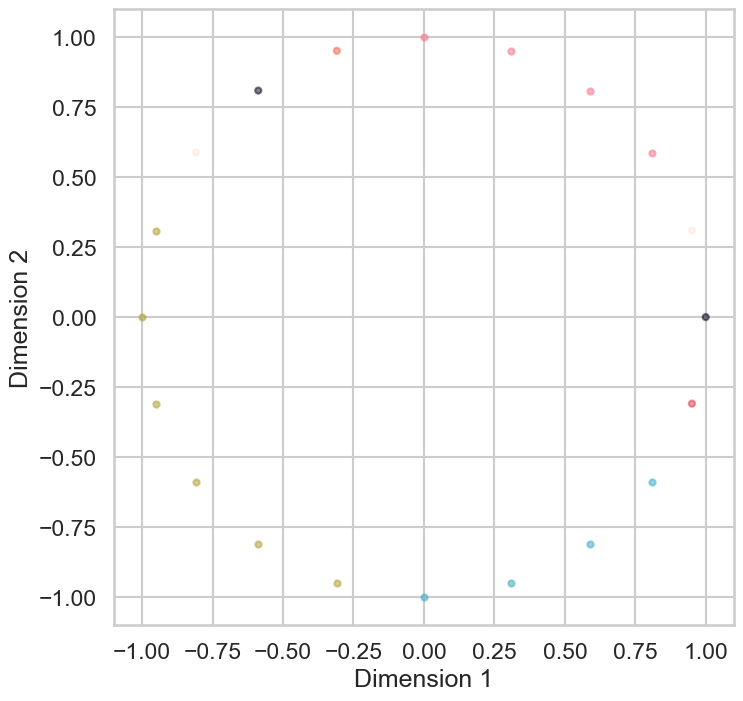

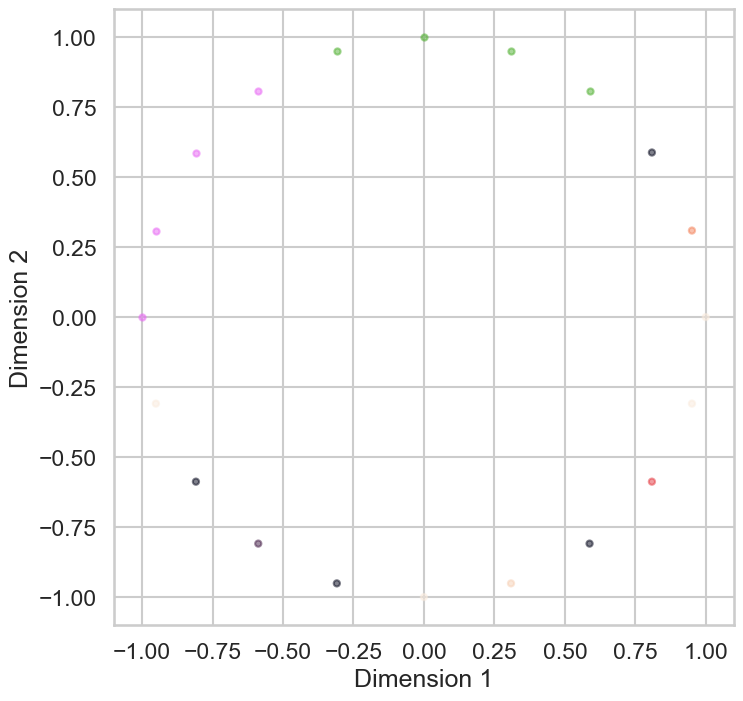

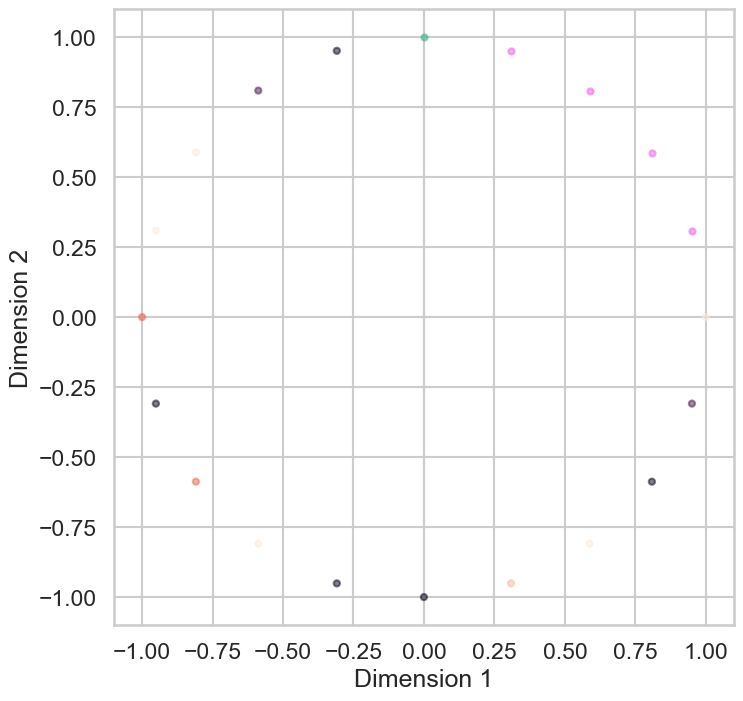

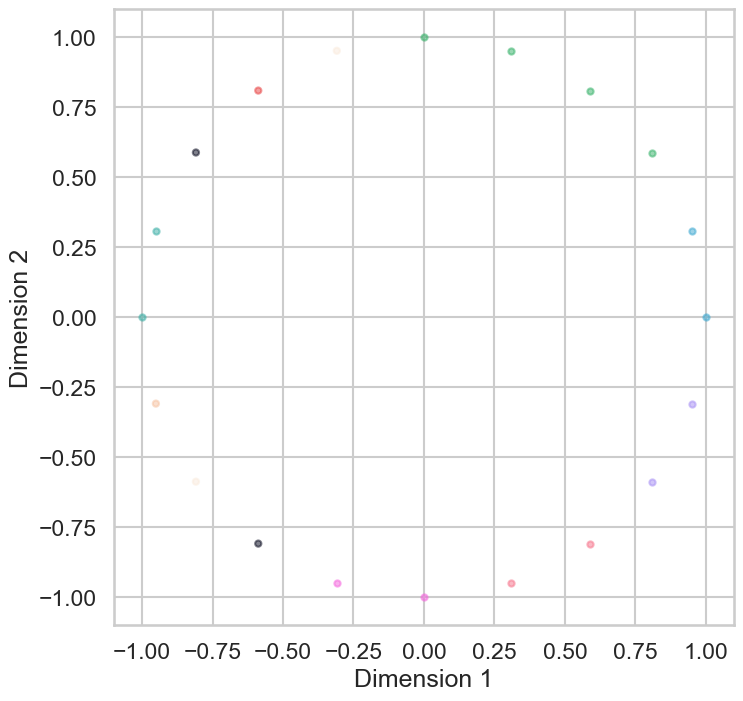

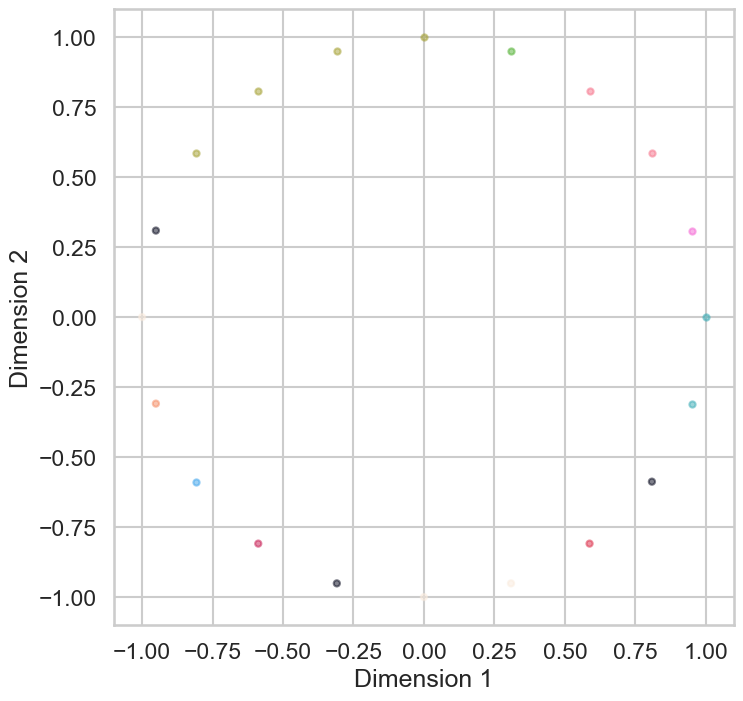

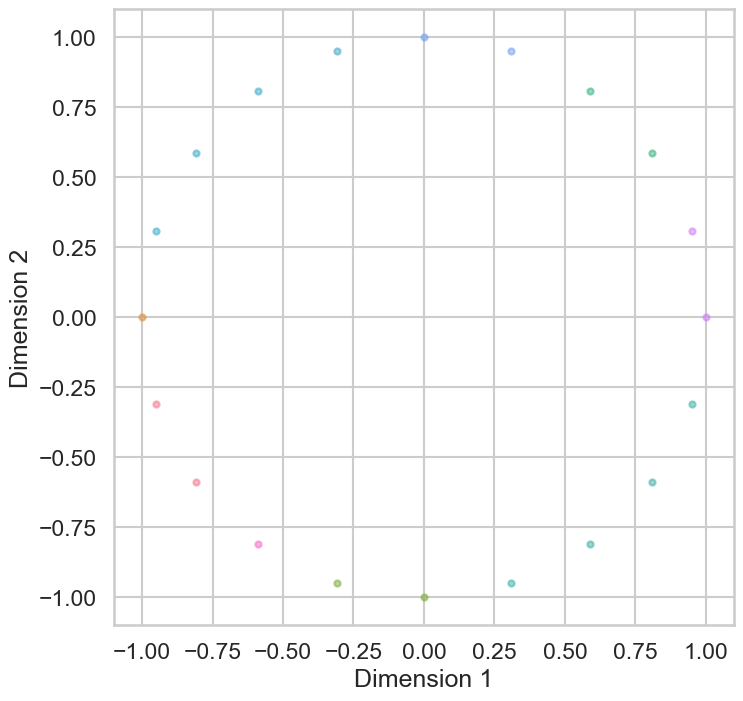

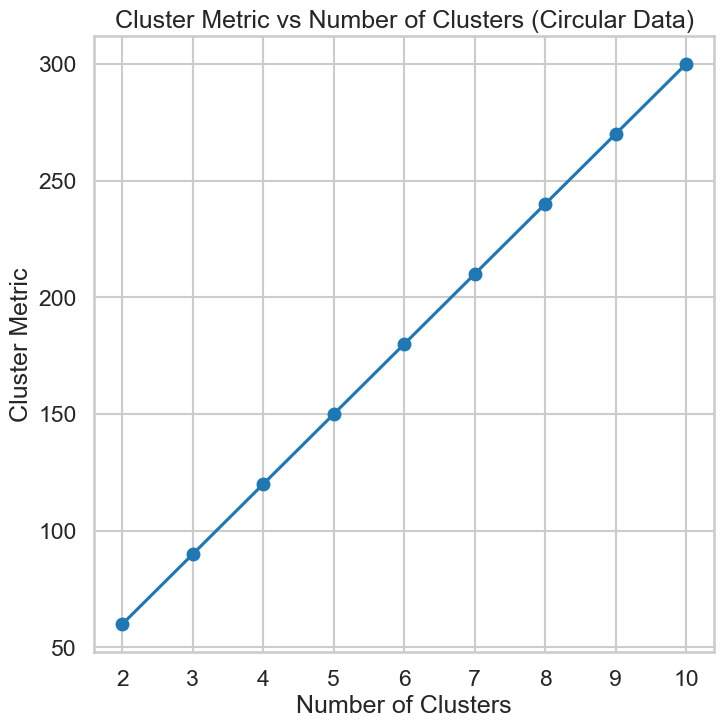

In [48]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_blobs, make_moons

# Varying number of clusters from 2 to 10
num_clusters_range = range(2, 11)

# Example 1: Circular Data
plt.rcParams['figure.figsize'] = [8, 8]
sns.set_style("whitegrid")
sns.set_context("talk")

angle = np.linspace(0, 2*np.pi, 20, endpoint=False)
X_circle = np.append([np.cos(angle)], [np.sin(angle)], 0).transpose()
cluster_metrics_circle = []

for k in num_clusters_range:
    result_circle = GUC_Kmean(X_circle, Number_of_Clusters=k, Distance_Type='pearson')
    cluster_metrics_circle.append(np.sum(result_circle[0]**2))

    # Display and plot (Note: For 2D data only)
    if X_circle.shape[1] == 2:
        color_palette = sns.color_palette("husl", n_colors=k)  # Use a different color palette
        display_cluster_multi_dim(X_circle, km=result_circle, num_clusters=k, color_palette=color_palette)

# Plot Cluster Metric versus Number of Clusters
plt.figure()
plt.plot(num_clusters_range, cluster_metrics_circle, marker='o')
plt.title('Cluster Metric vs Number of Clusters (Circular Data)')
plt.xlabel('Number of Clusters')
plt.ylabel('Cluster Metric')
plt.show()

# THIS IS EXAMPLE 2 BY USING EUCLIDEAN DISTANCE

/var/folders/t2/xlvk3_8d6bq8g5hggghj0l940000gn/T/ipykernel_1281/2449504459.py:16: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(X[km[assigned_clusters_index] == i, 0],


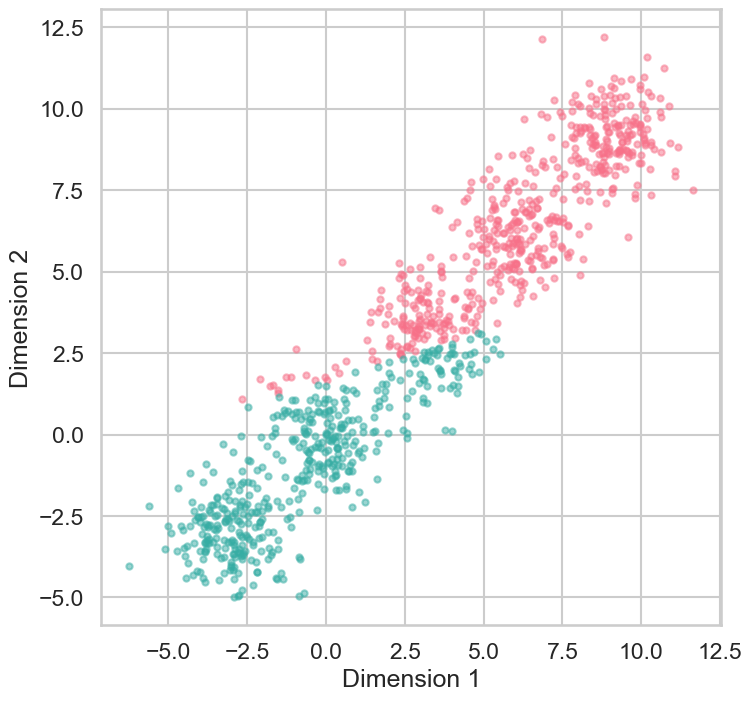

/Users/maria/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/maria/anaconda3/lib/python3.11/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


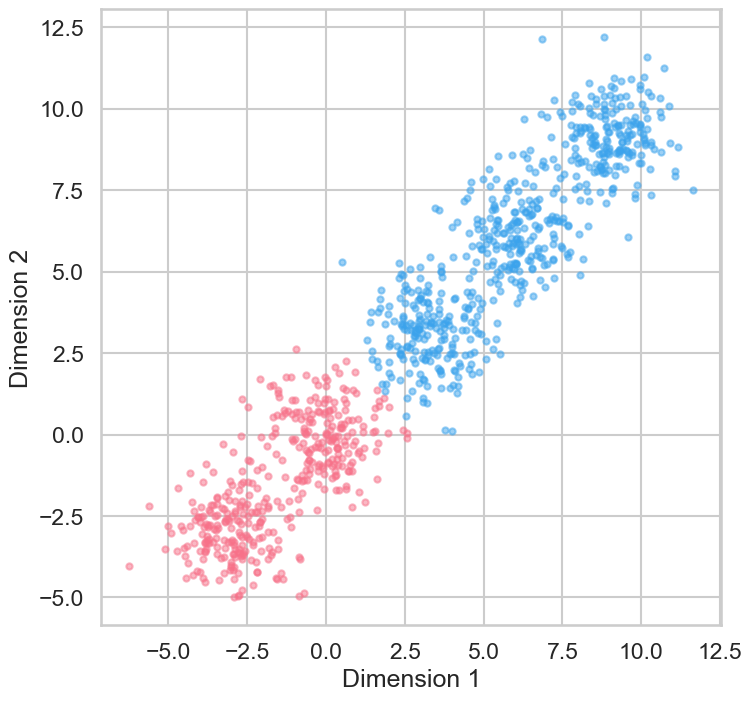

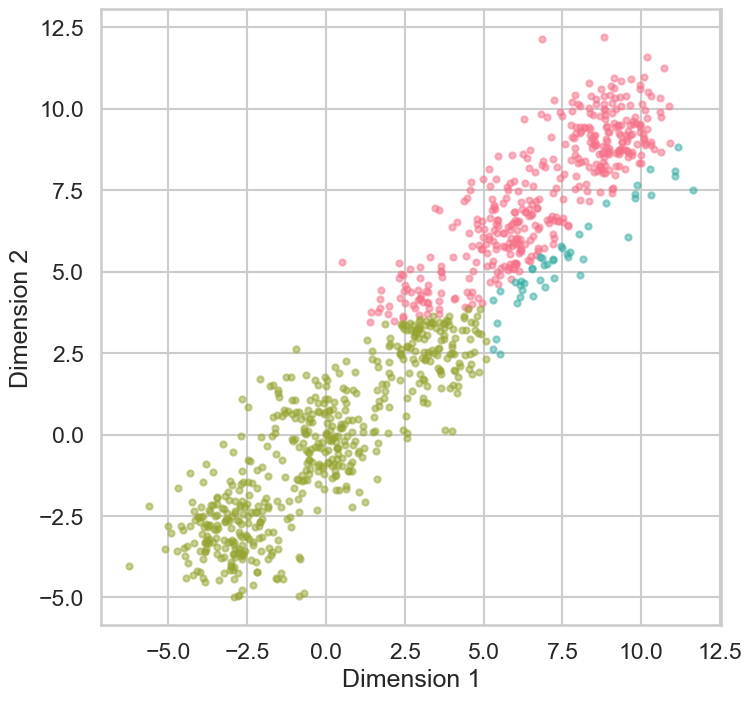

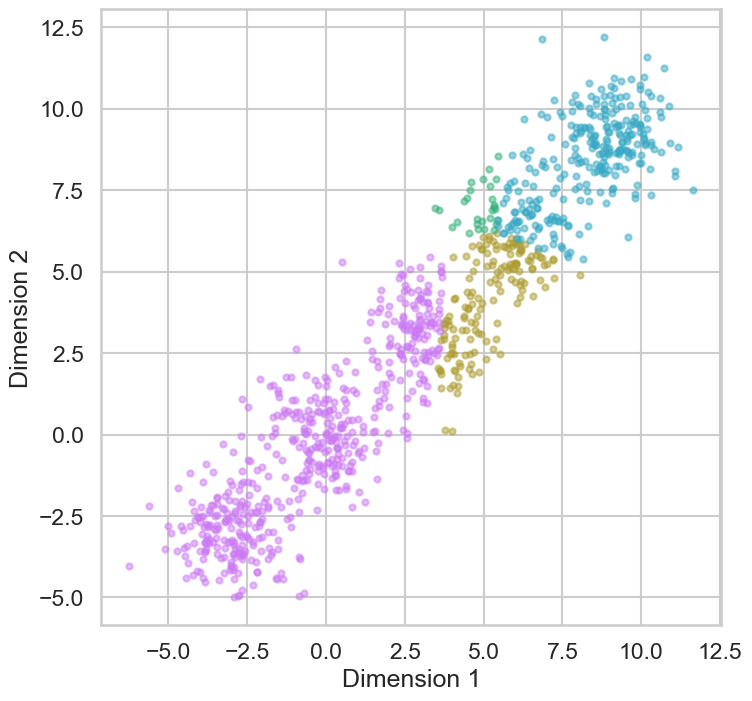

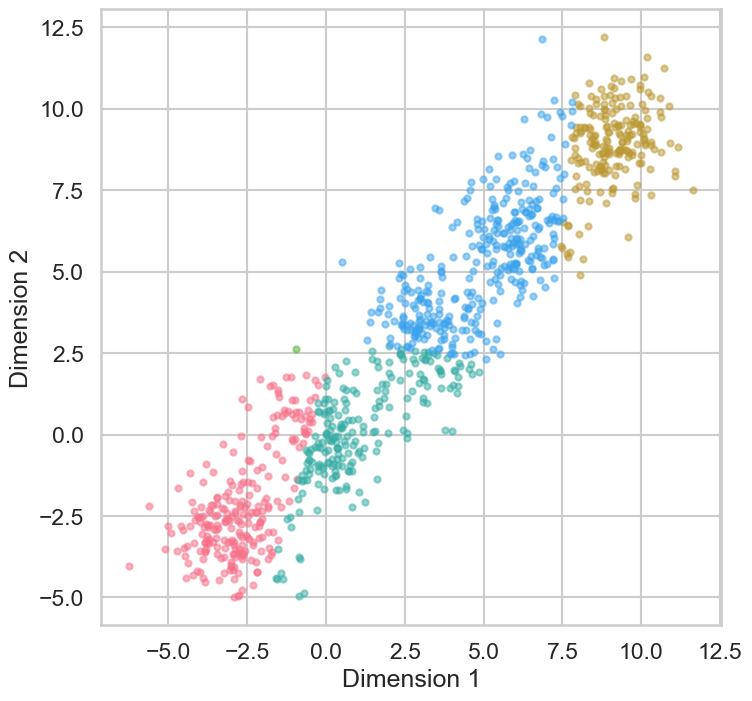

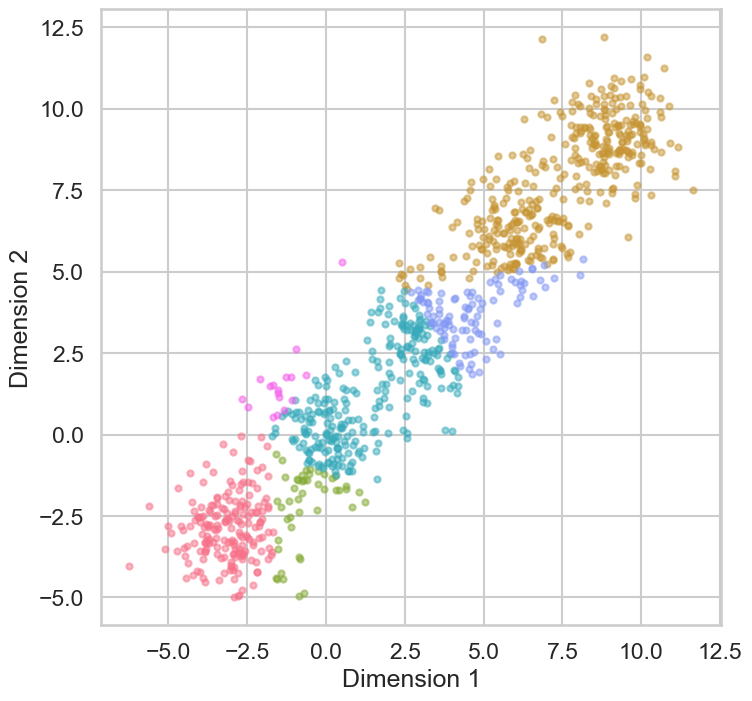

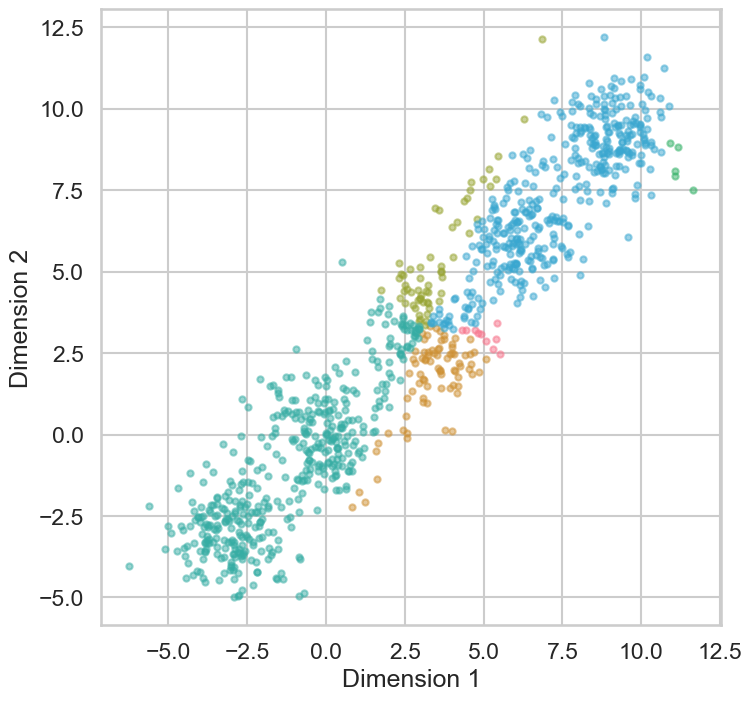

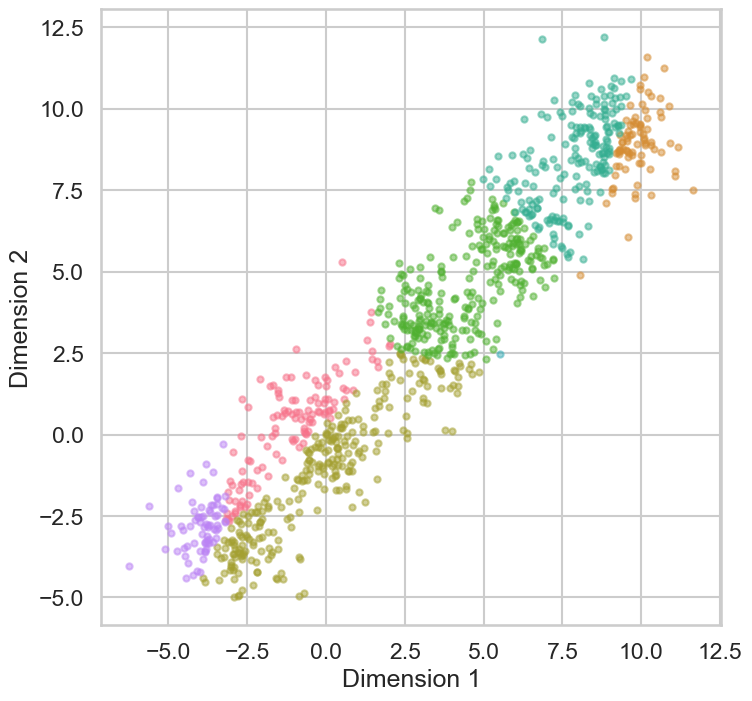

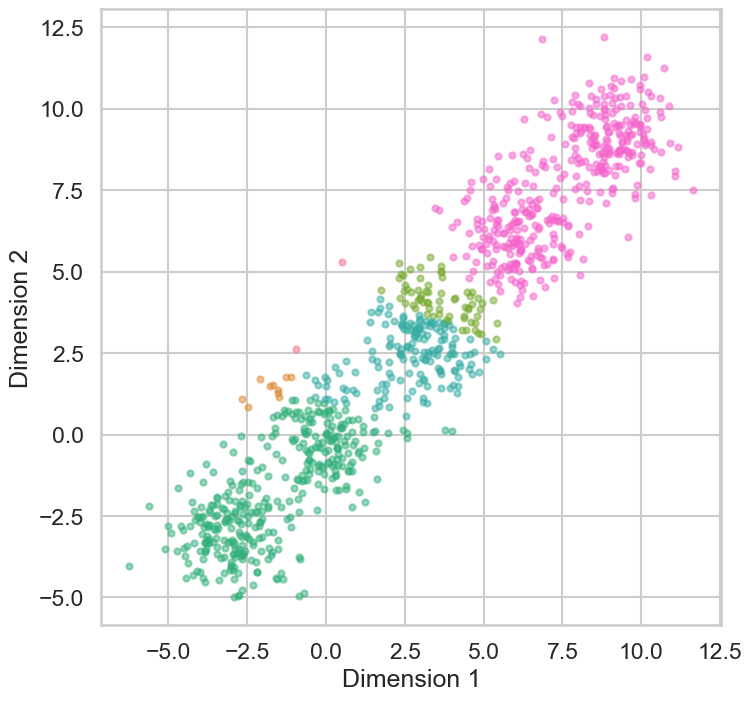

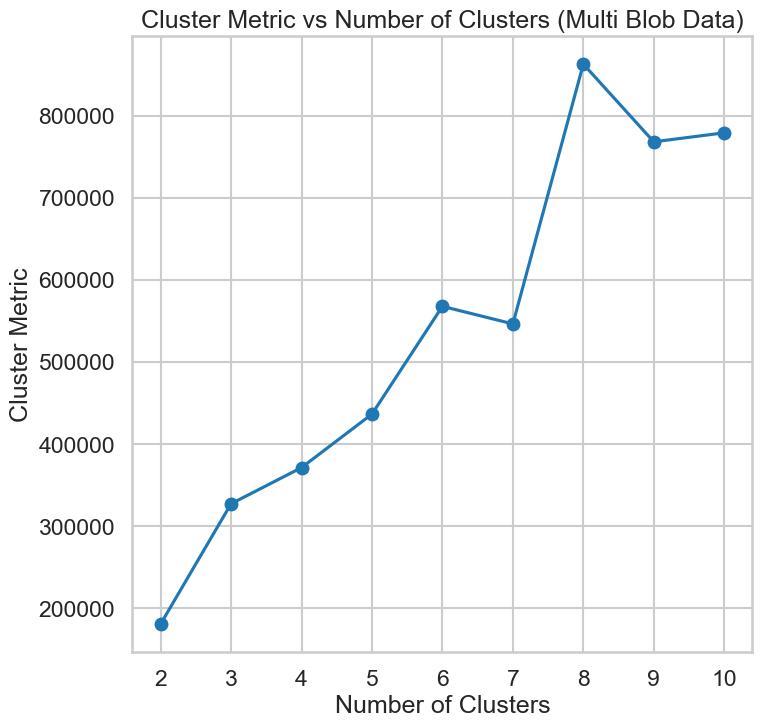

In [46]:
# Example 2: Multi Blob Data
n_samples = 1000
n_bins = 4
centers = [(-3, -3), (0, 0), (3, 3), (6, 6), (9, 9)]
X_blob, _ = make_blobs(n_samples=n_samples, n_features=2, cluster_std=1.0,
                        centers=centers, shuffle=False, random_state=42)
cluster_metrics_blob = []

for k in num_clusters_range:
    result_blob = GUC_Kmean(X_blob, Number_of_Clusters=k, Distance_Type='euclidean')
    cluster_metrics_blob.append(np.sum(result_blob[0]**2))

    # Display and plot (Note: For 2D data only)
    if X_blob.shape[1] == 2:
        color_palette = sns.color_palette("husl", n_colors=k)  # Use a different color palette
        display_cluster_multi_dim(X_blob, km=result_blob, num_clusters=k, color_palette=color_palette)

# Plot Cluster Metric versus Number of Clusters
plt.figure()
plt.plot(num_clusters_range, cluster_metrics_blob, marker='o')
plt.title('Cluster Metric vs Number of Clusters (Multi Blob Data)')
plt.xlabel('Number of Clusters')
plt.ylabel('Cluster Metric')
plt.show()


# THIS IS EXAMPLE 2 BY USING PEARSON DISTANCE

/var/folders/t2/xlvk3_8d6bq8g5hggghj0l940000gn/T/ipykernel_1281/2449504459.py:16: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(X[km[assigned_clusters_index] == i, 0],


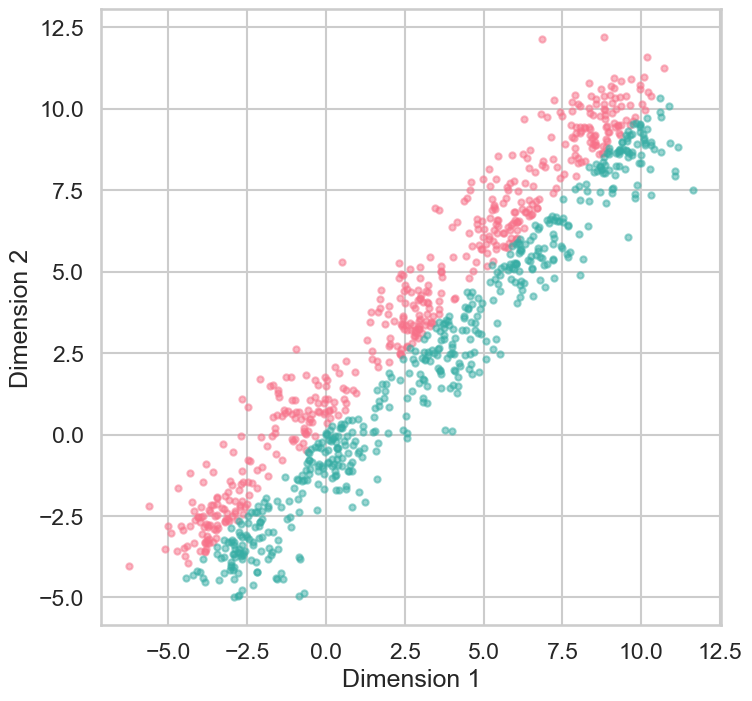

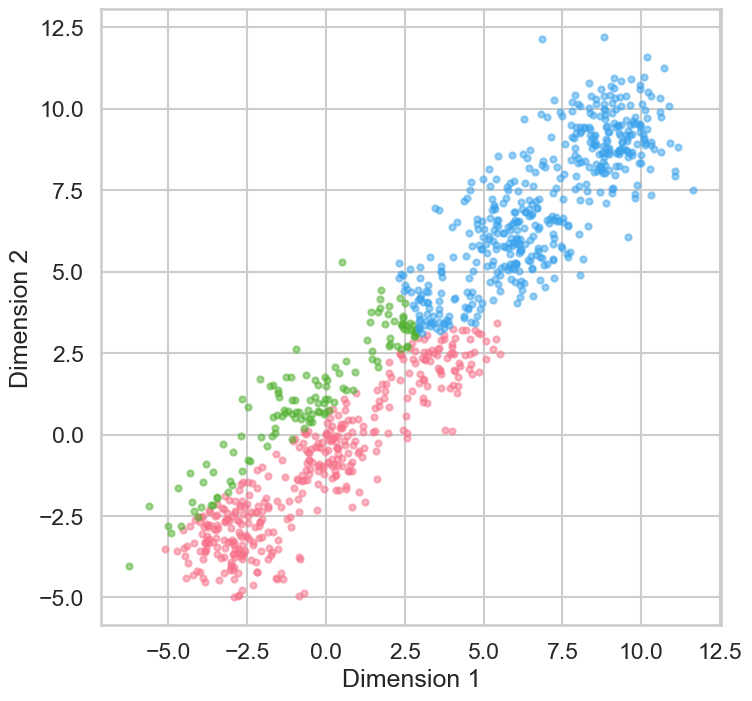

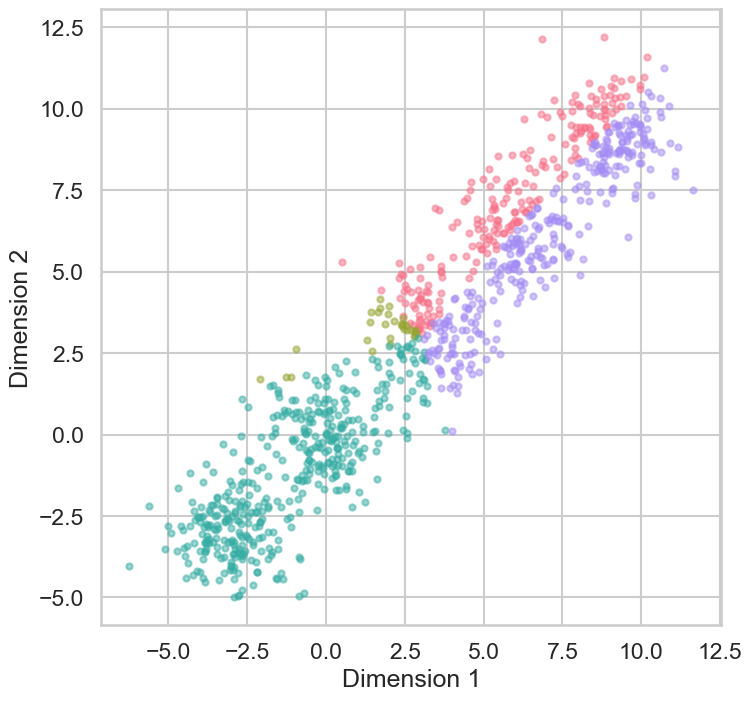

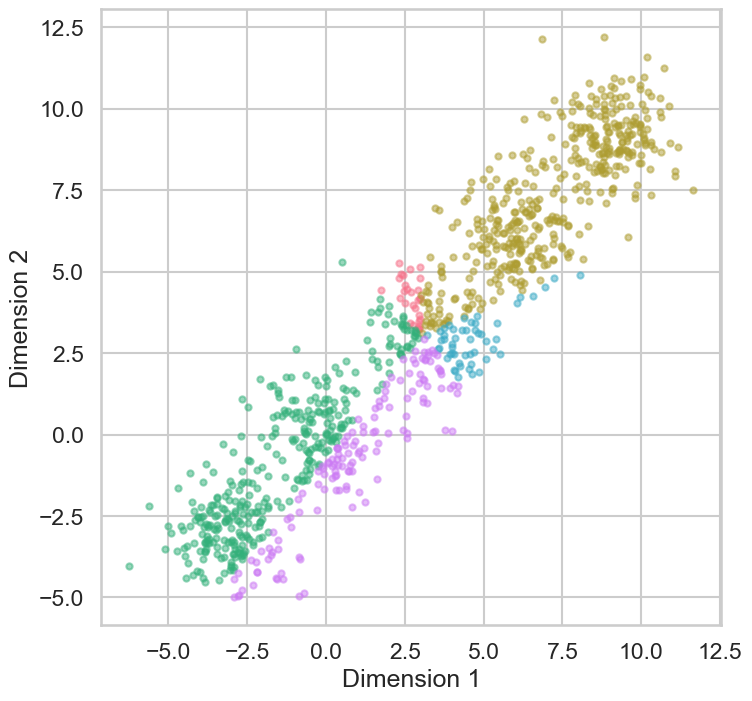

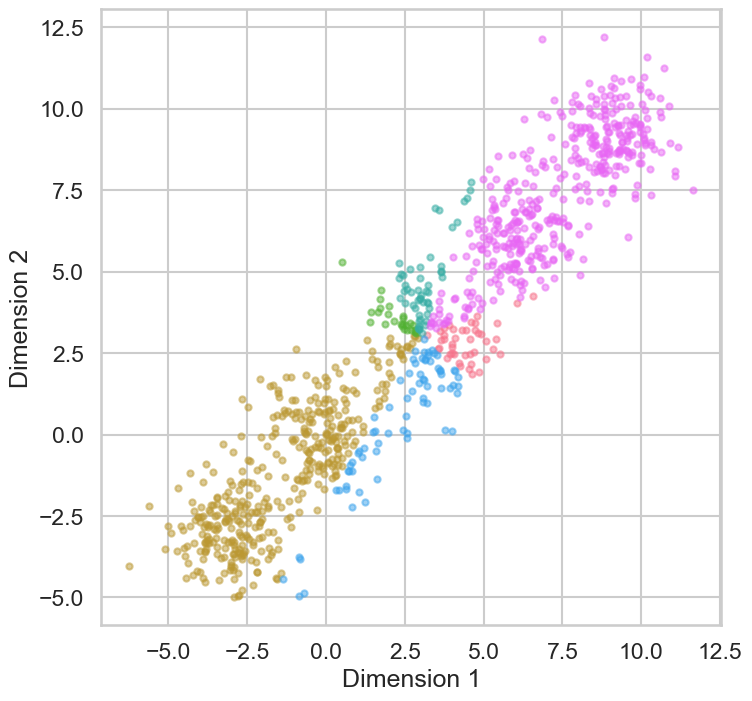

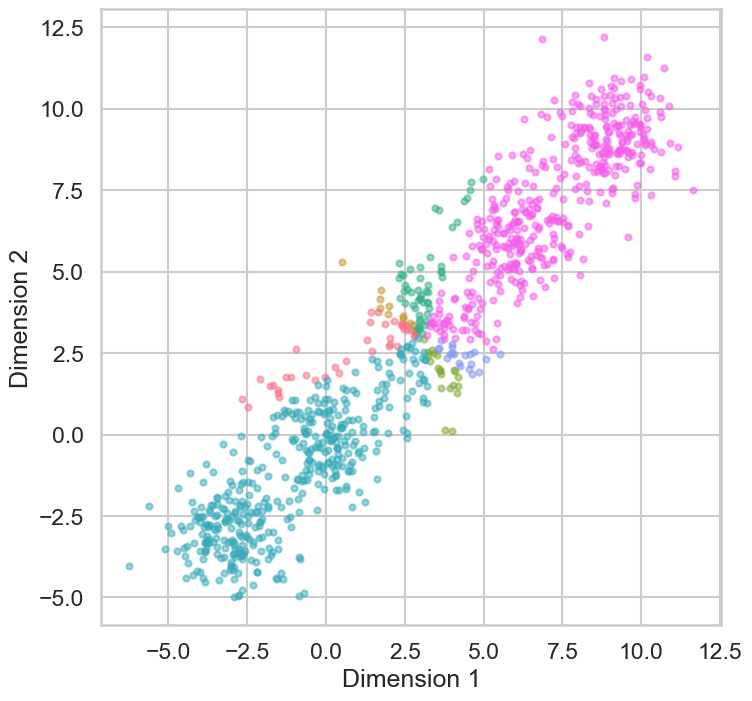

/Users/maria/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/maria/anaconda3/lib/python3.11/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


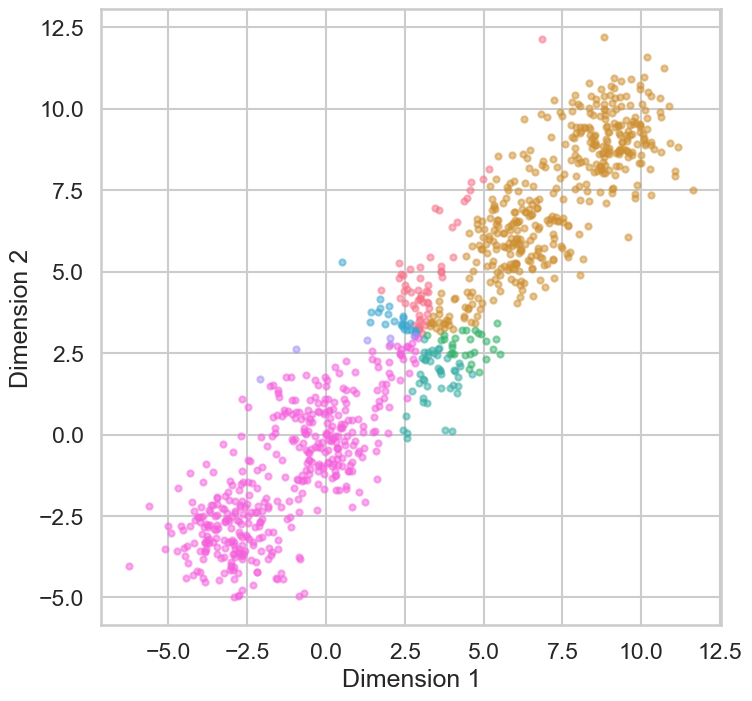

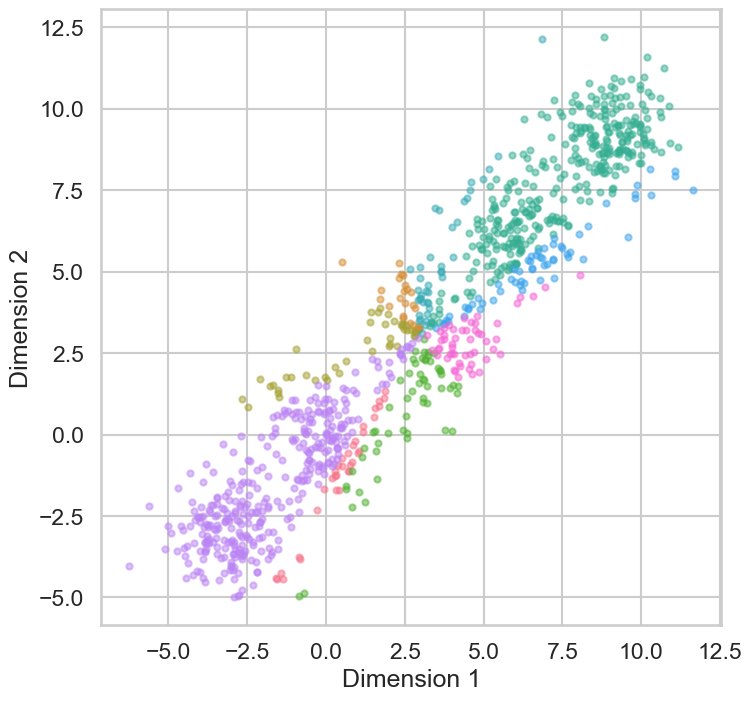

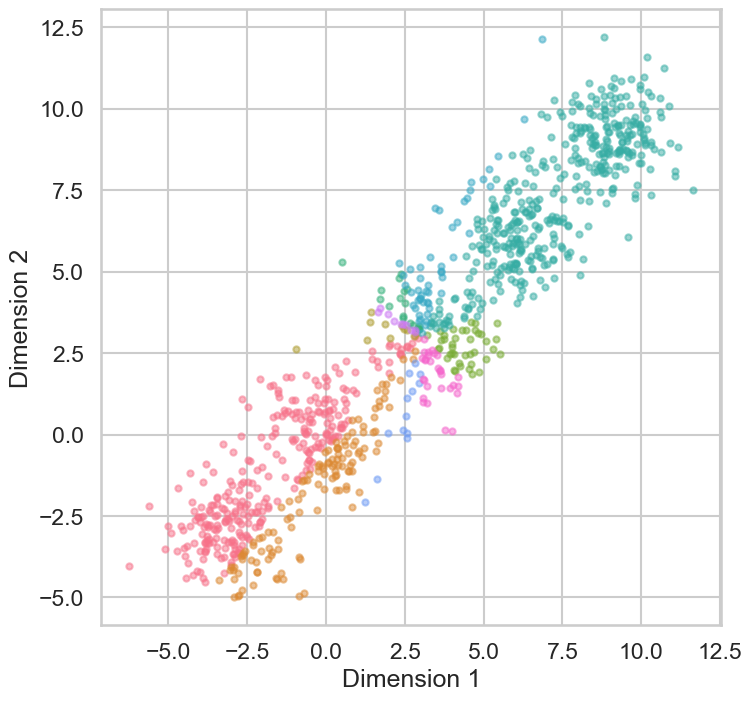

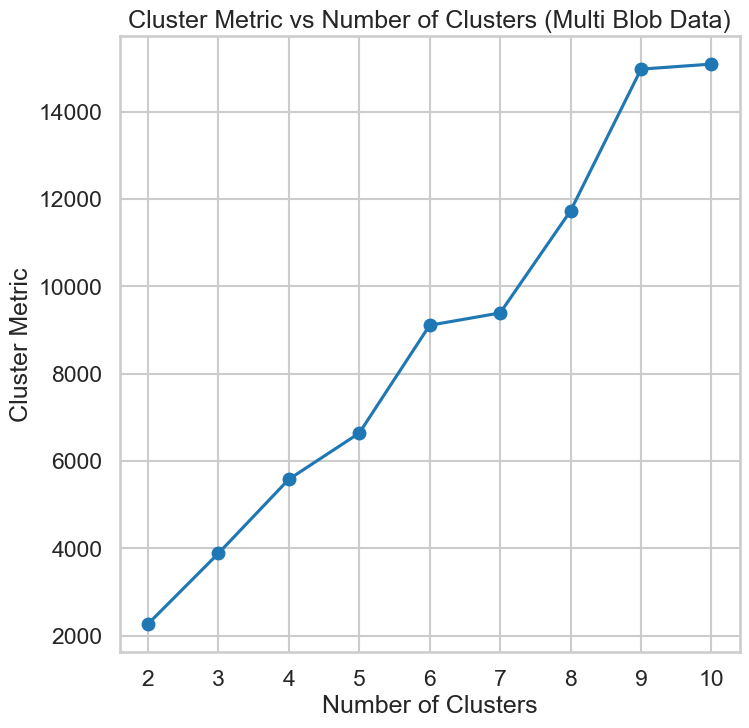

In [49]:
# Example 2: Multi Blob Data
n_samples = 1000
n_bins = 4
centers = [(-3, -3), (0, 0), (3, 3), (6, 6), (9, 9)]
X_blob, _ = make_blobs(n_samples=n_samples, n_features=2, cluster_std=1.0,
                        centers=centers, shuffle=False, random_state=42)
cluster_metrics_blob = []

for k in num_clusters_range:
    result_blob = GUC_Kmean(X_blob, Number_of_Clusters=k, Distance_Type='pearson')
    cluster_metrics_blob.append(np.sum(result_blob[0]**2))

    # Display and plot (Note: For 2D data only)
    if X_blob.shape[1] == 2:
        color_palette = sns.color_palette("husl", n_colors=k)  # Use a different color palette
        display_cluster_multi_dim(X_blob, km=result_blob, num_clusters=k, color_palette=color_palette)

# Plot Cluster Metric versus Number of Clusters
plt.figure()
plt.plot(num_clusters_range, cluster_metrics_blob, marker='o')
plt.title('Cluster Metric vs Number of Clusters (Multi Blob Data)')
plt.xlabel('Number of Clusters')
plt.ylabel('Cluster Metric')
plt.show()

# THIS IS EXAMPLE 3 BY USING EUCLIDEAN DISTANCE

/var/folders/t2/xlvk3_8d6bq8g5hggghj0l940000gn/T/ipykernel_1281/2449504459.py:16: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(X[km[assigned_clusters_index] == i, 0],


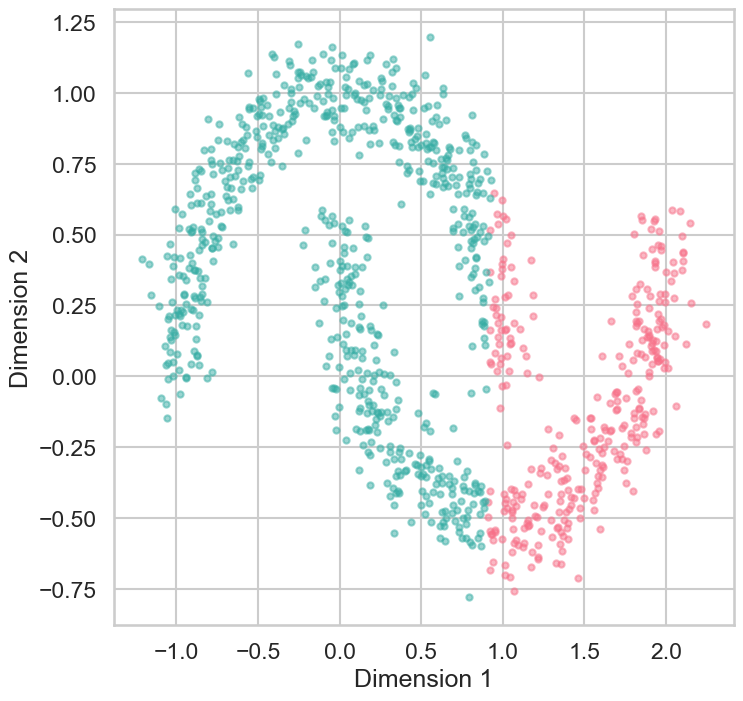

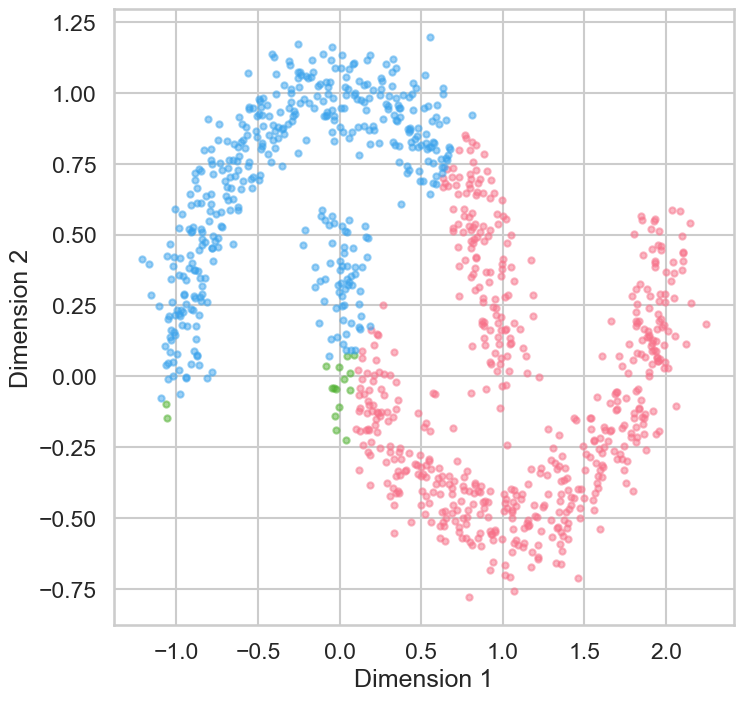

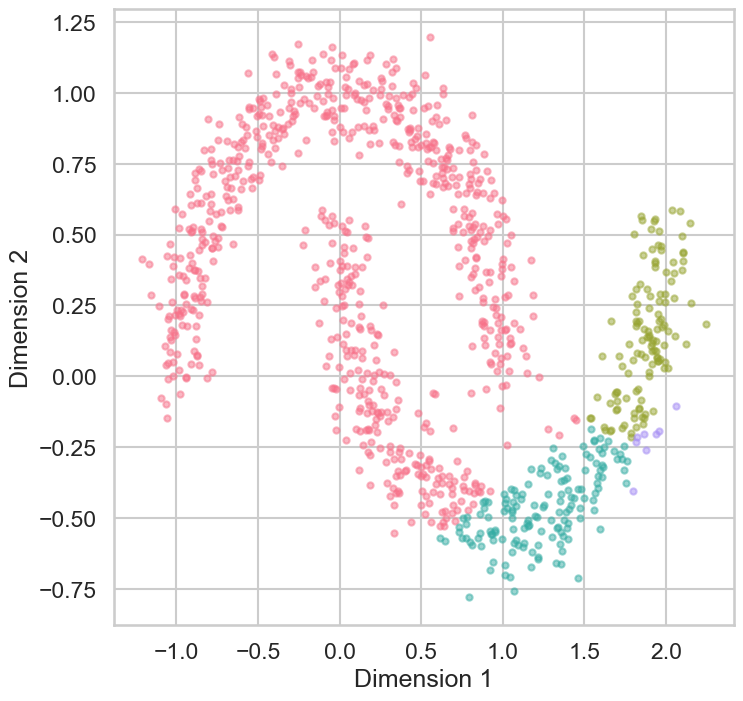

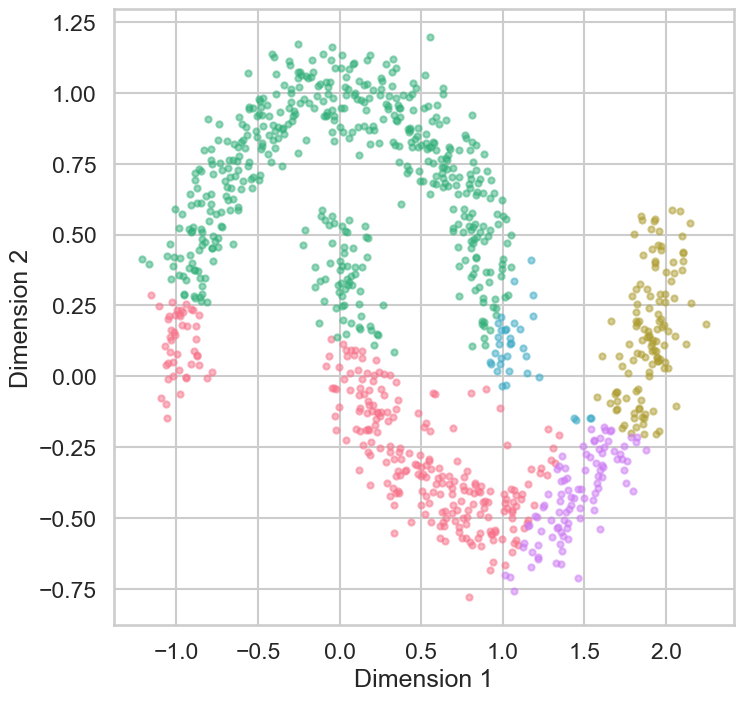

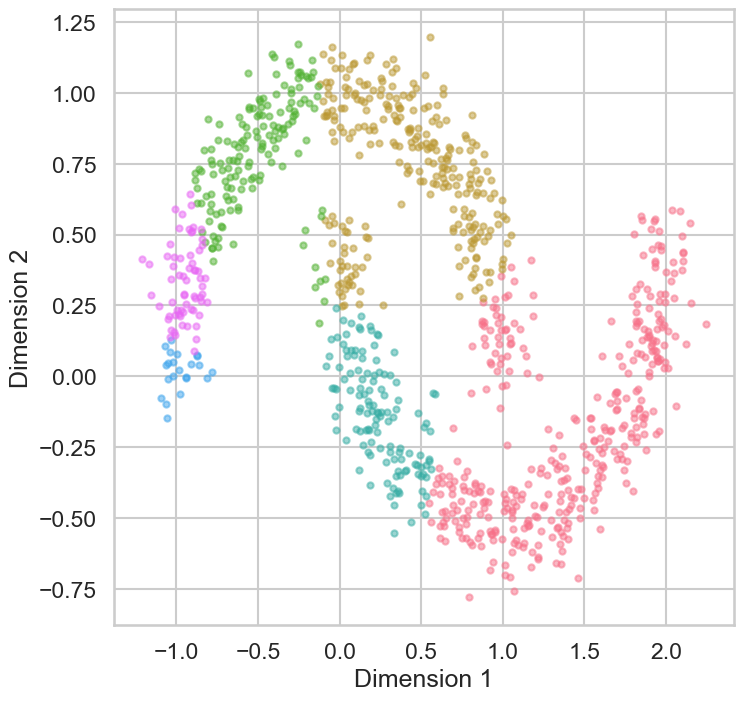

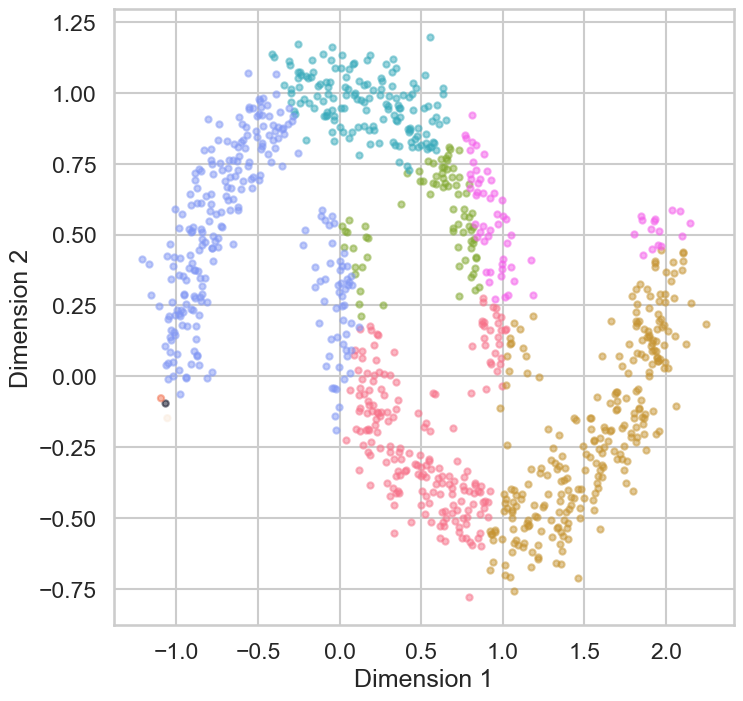

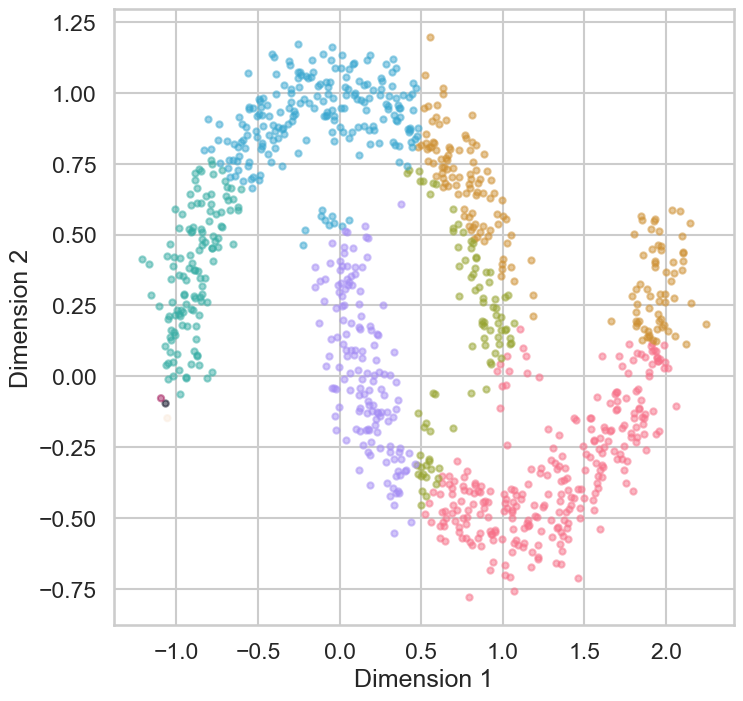

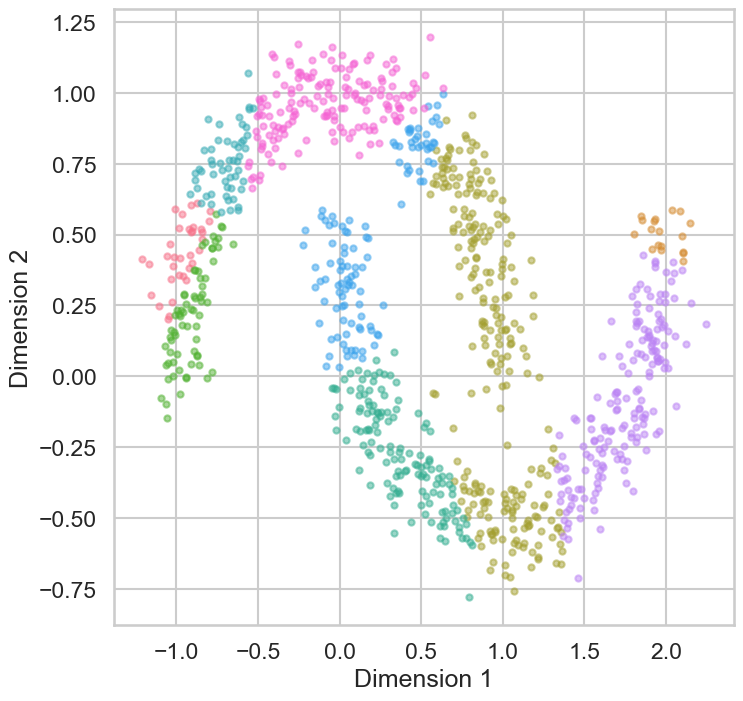

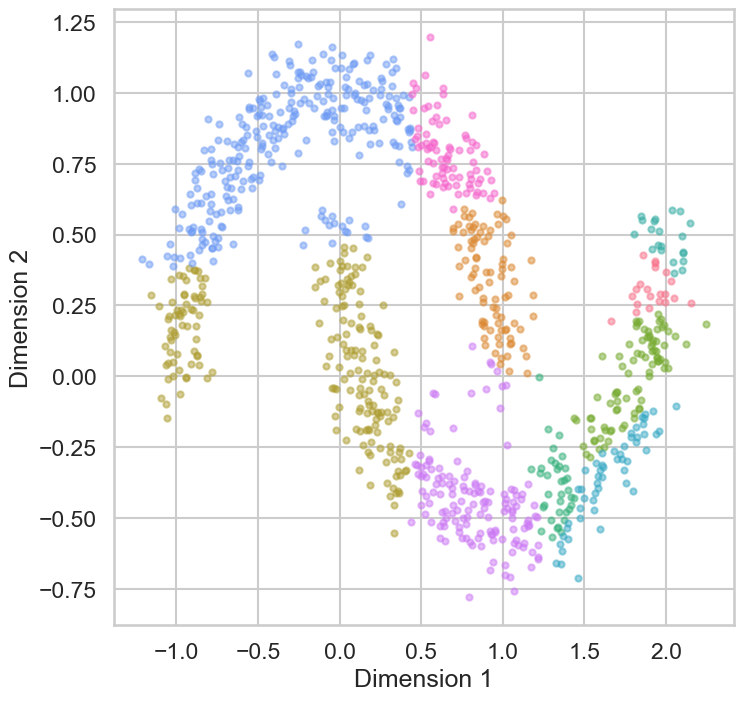

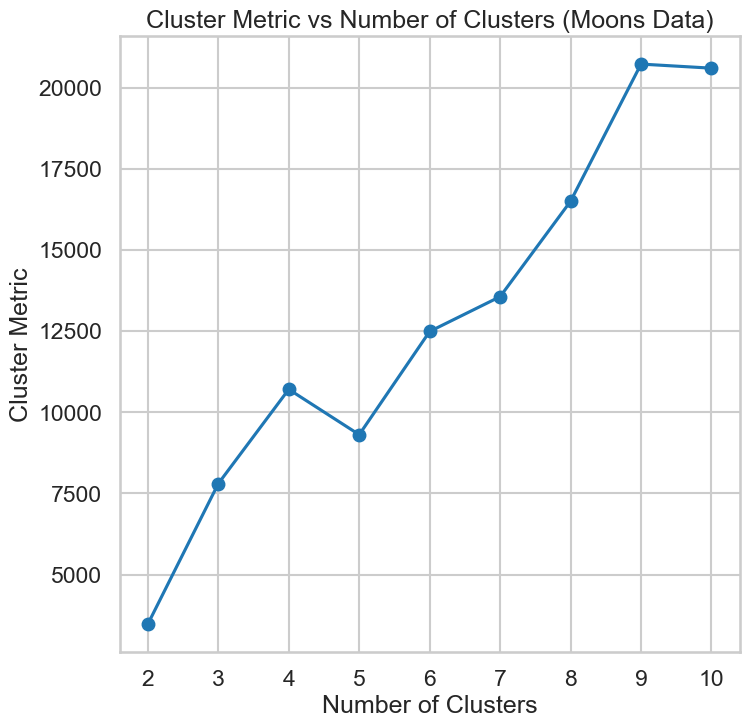

In [47]:
# Example 3: Moons Data
n_samples = 1000
X_moons, _ = make_moons(n_samples=n_samples, noise=0.1)
cluster_metrics_moons = []

for k in num_clusters_range:
    result_moons = GUC_Kmean(X_moons, Number_of_Clusters=k, Distance_Type='euclidean')
    cluster_metrics_moons.append(np.sum(result_moons[0]**2))

    # Display and plot (Note: For 2D data only)
    if X_moons.shape[1] == 2:
        color_palette = sns.color_palette("husl", n_colors=k)  # Use a different color palette
        display_cluster_multi_dim(X_moons, km=result_moons, num_clusters=k, color_palette=color_palette)

# Plot Cluster Metric versus Number of Clusters
plt.figure()
plt.plot(num_clusters_range, cluster_metrics_moons, marker='o')
plt.title('Cluster Metric vs Number of Clusters (Moons Data)')
plt.xlabel('Number of Clusters')
plt.ylabel('Cluster Metric')
plt.show()


# THIS IS EXAMPLE 3 BY USING PEARSON DISTANCE

/var/folders/t2/xlvk3_8d6bq8g5hggghj0l940000gn/T/ipykernel_1281/2449504459.py:16: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(X[km[assigned_clusters_index] == i, 0],


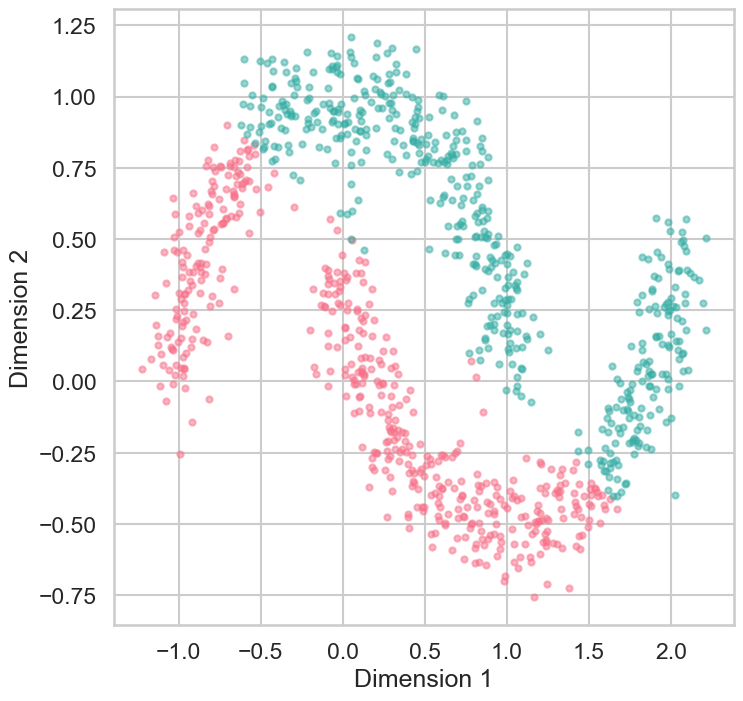

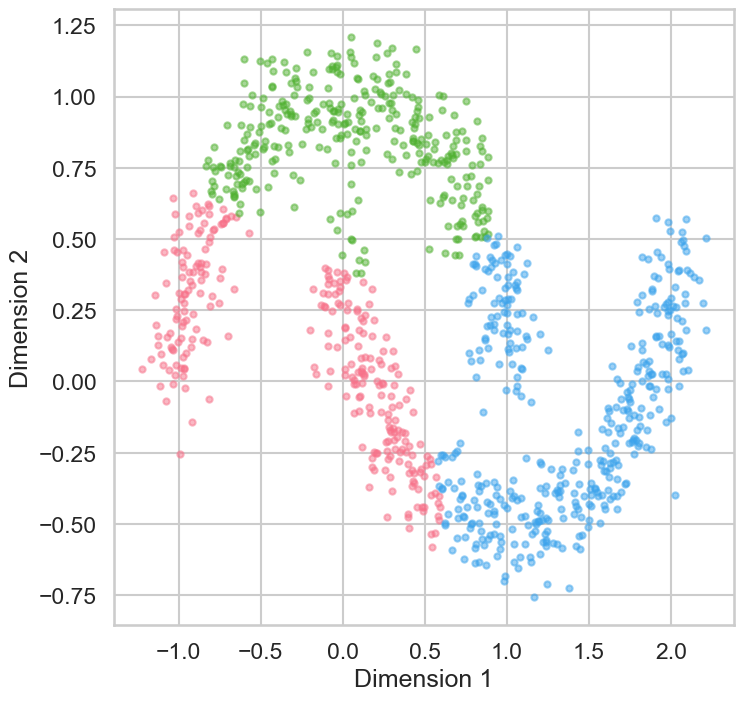

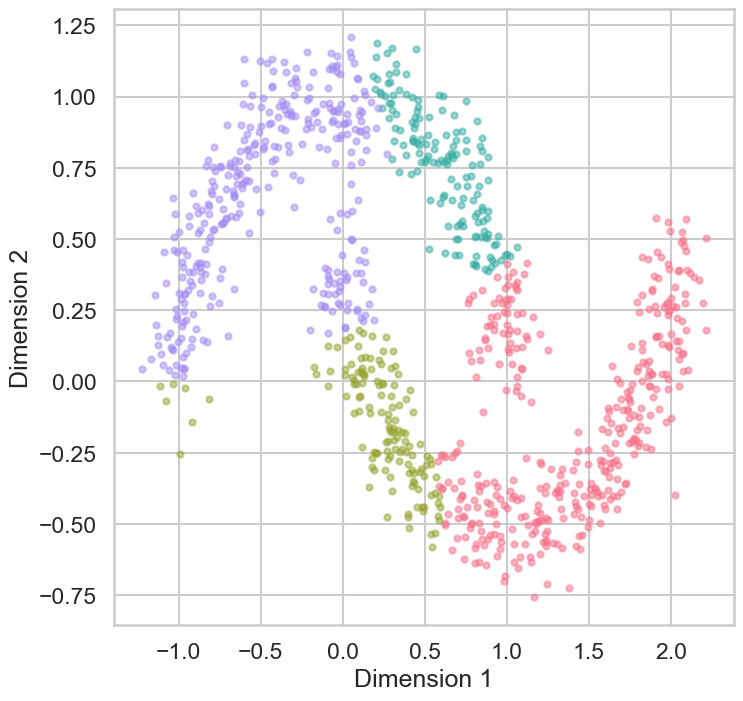

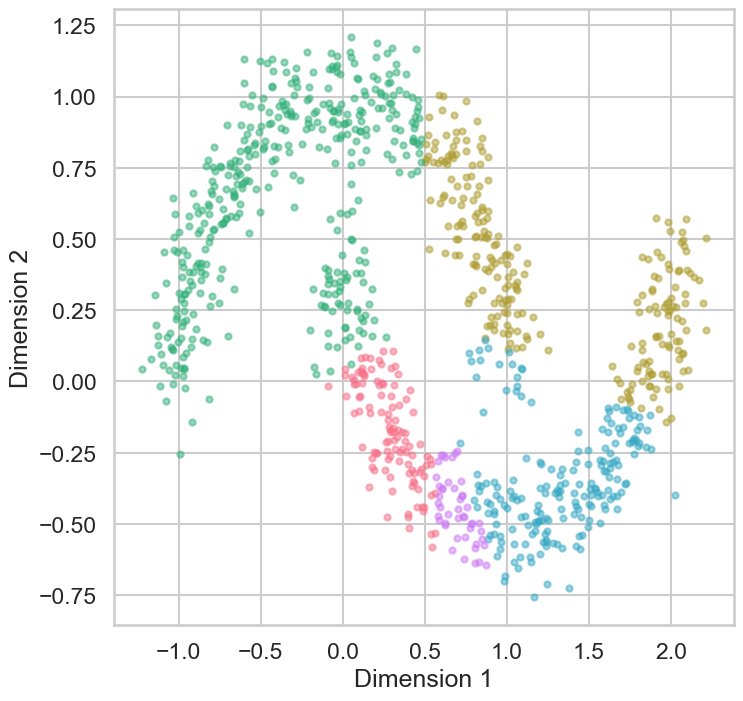

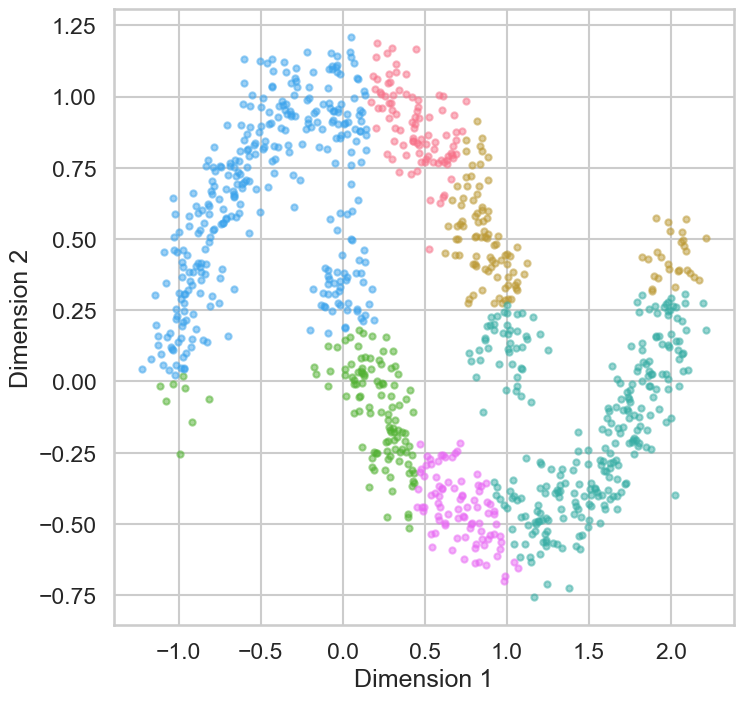

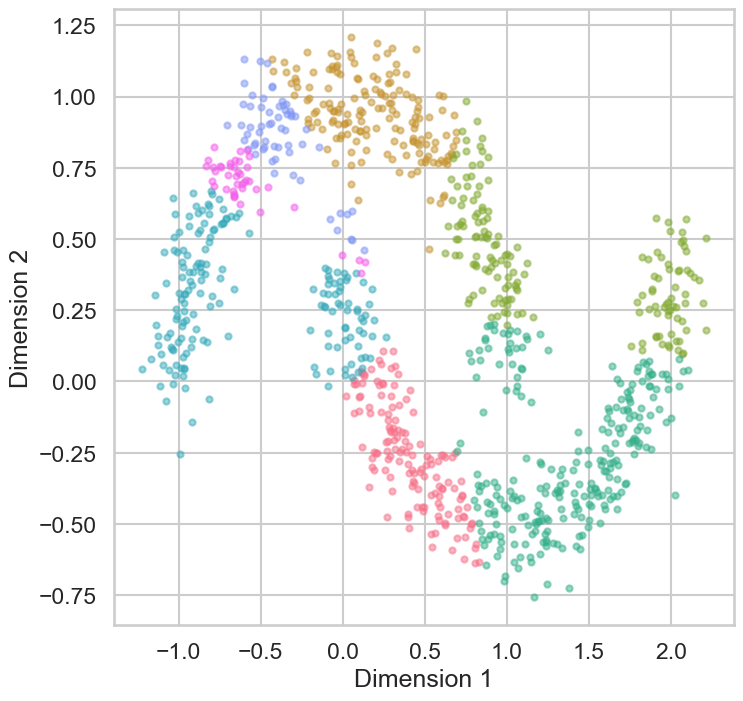

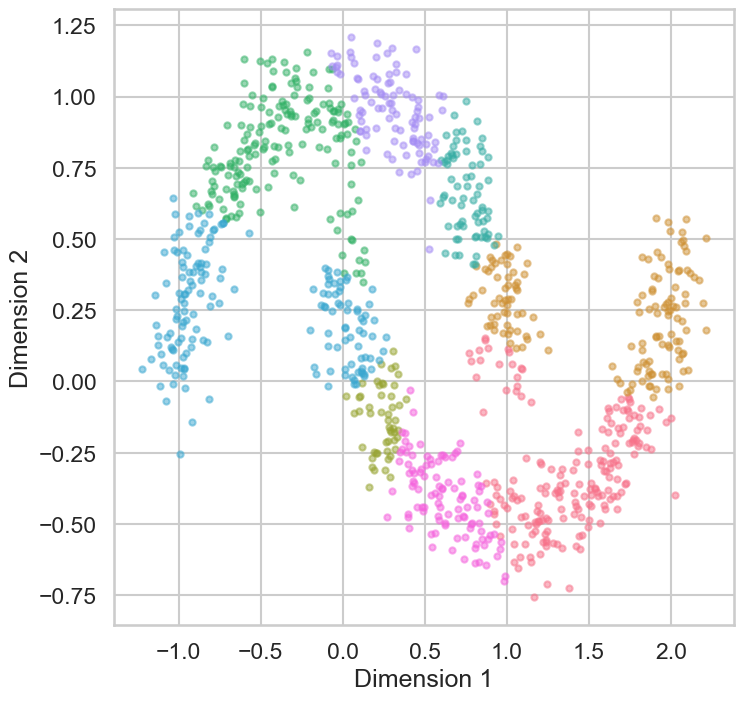

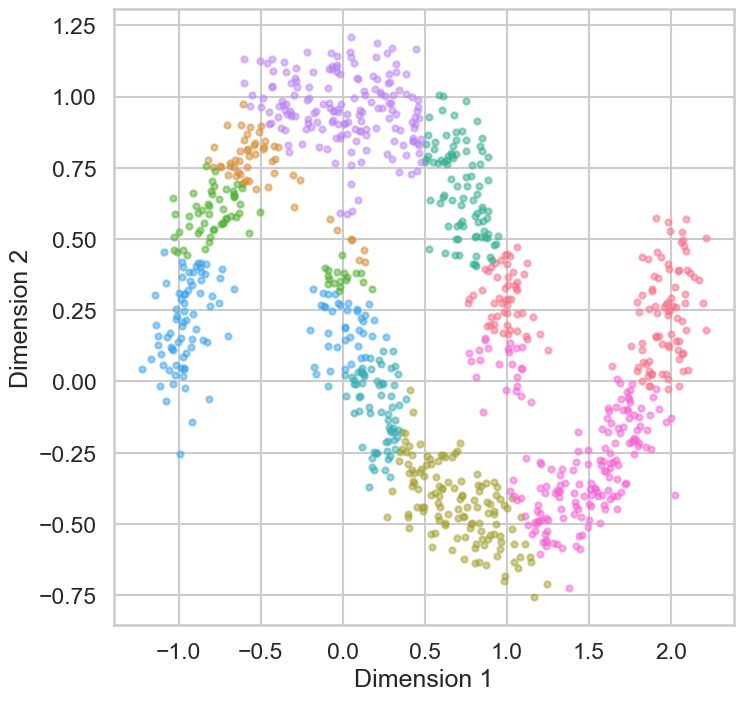

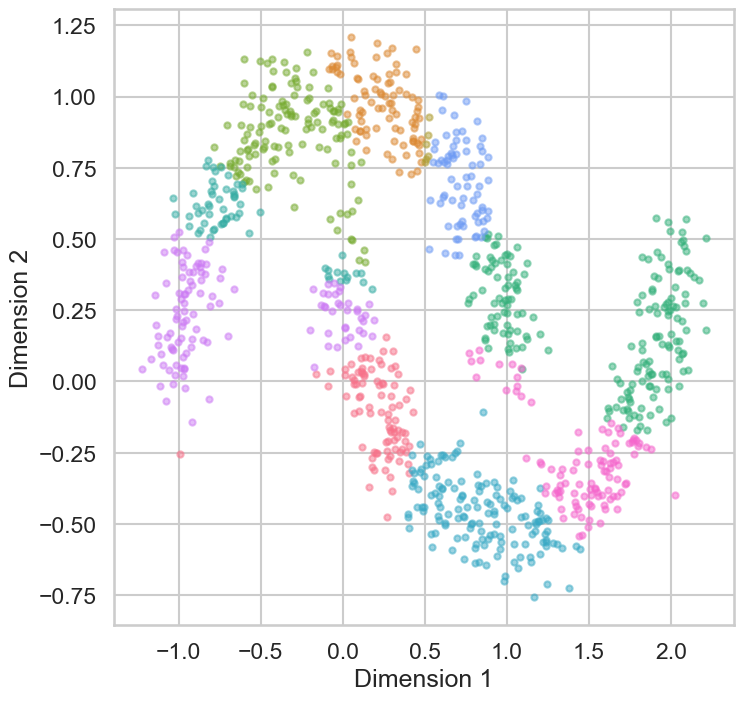

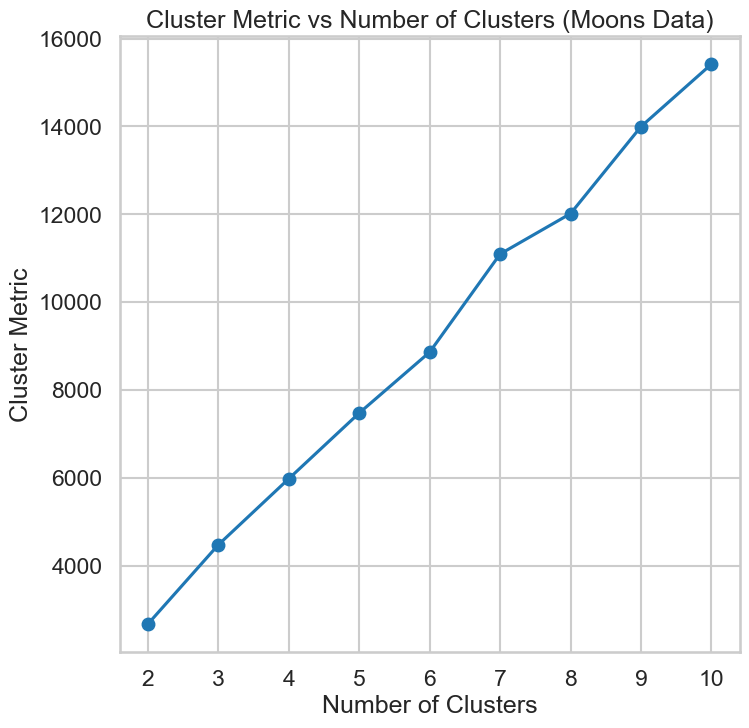

In [50]:
# Example 3: Moons Data
n_samples = 1000
X_moons, _ = make_moons(n_samples=n_samples, noise=0.1)
cluster_metrics_moons = []

for k in num_clusters_range:
    result_moons = GUC_Kmean(X_moons, Number_of_Clusters=k, Distance_Type='pearson')
    cluster_metrics_moons.append(np.sum(result_moons[0]**2))

    # Display and plot (Note: For 2D data only)
    if X_moons.shape[1] == 2:
        color_palette = sns.color_palette("husl", n_colors=k)  # Use a different color palette
        display_cluster_multi_dim(X_moons, km=result_moons, num_clusters=k, color_palette=color_palette)

# Plot Cluster Metric versus Number of Clusters
plt.figure()
plt.plot(num_clusters_range, cluster_metrics_moons, marker='o')
plt.title('Cluster Metric vs Number of Clusters (Moons Data)')
plt.xlabel('Number of Clusters')
plt.ylabel('Cluster Metric')
plt.show()

## 4. Using the GUC_Kmean function to segment customers int he provided customer dataset
1. Apply the GUC_Kmean fucntion to customer data  
2. Try a varing number of cluster that range from 2 to 10 cluster on each set 
3. Display your results.
4. plot the Cluster Metric versus the number of clusters
4. Change the distance function and repeat the above steps 

## THIS THE CLUSTERING OF THE DATASET CUSTOMER_DATA BY USING EUCLIDEAN DISTANCE

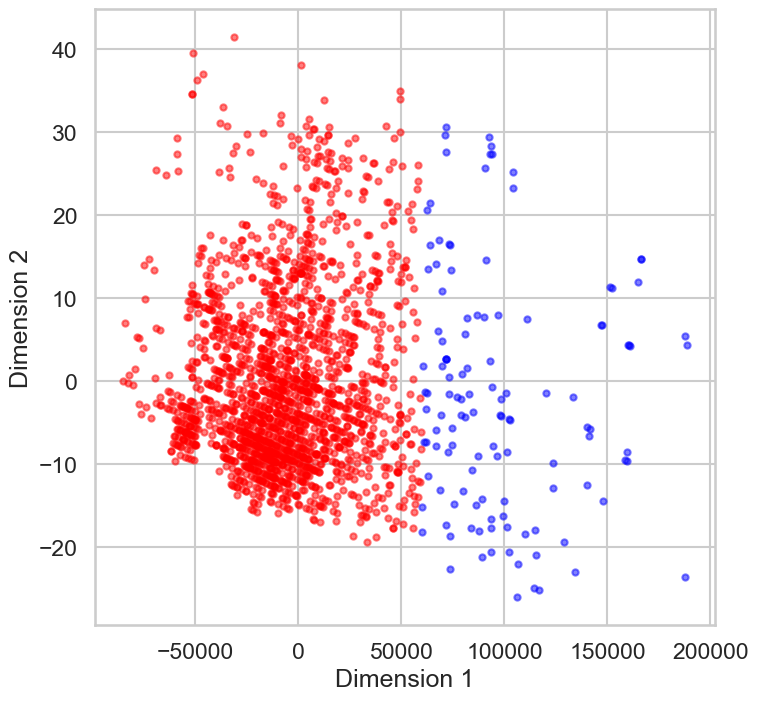

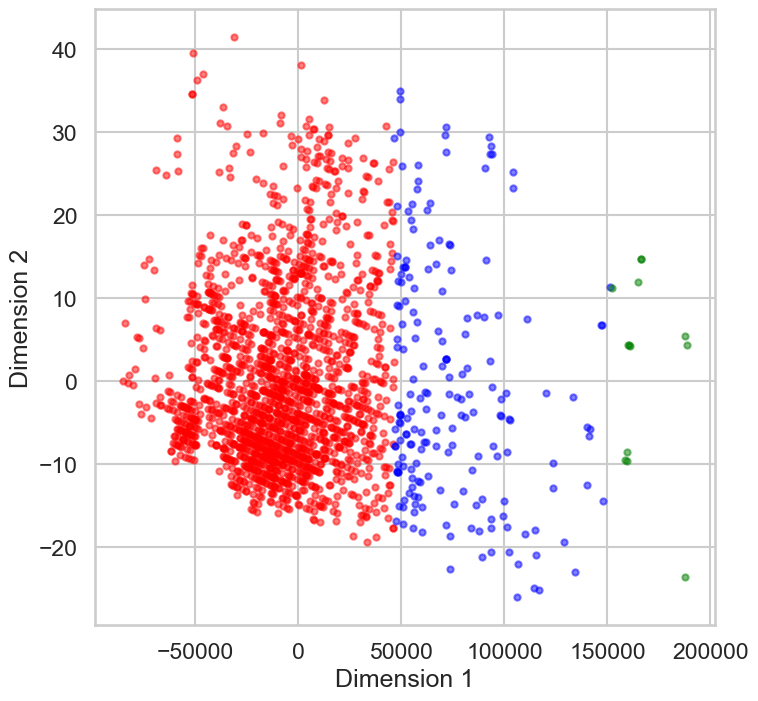

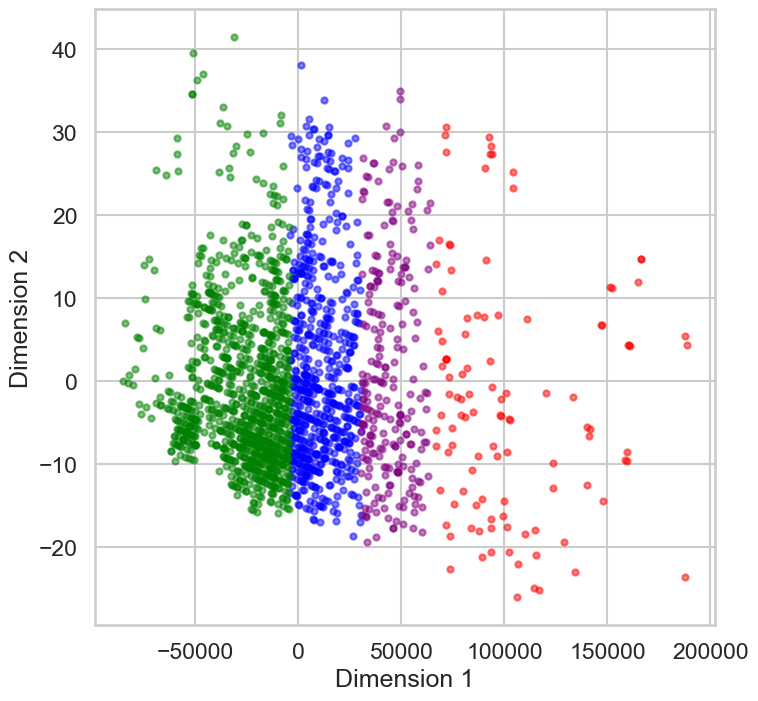

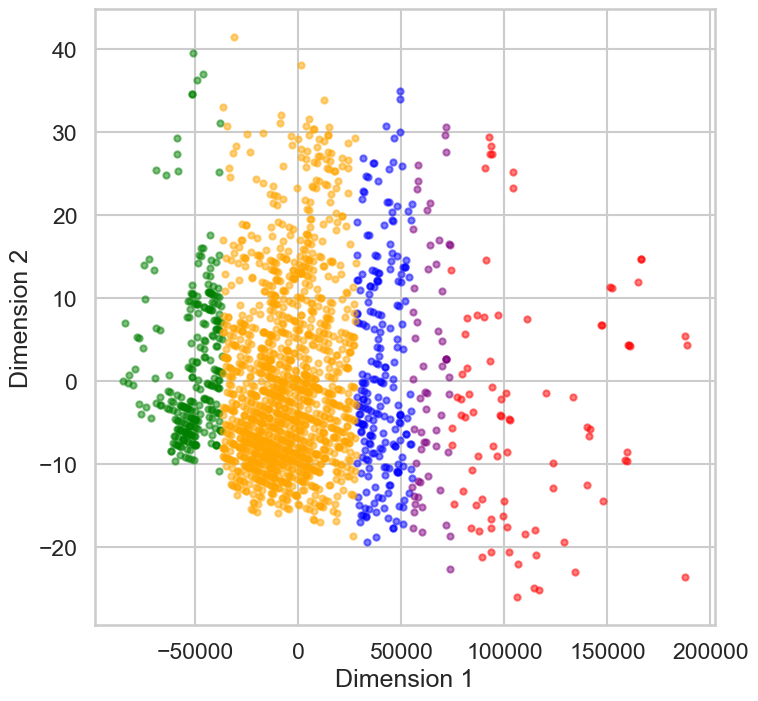

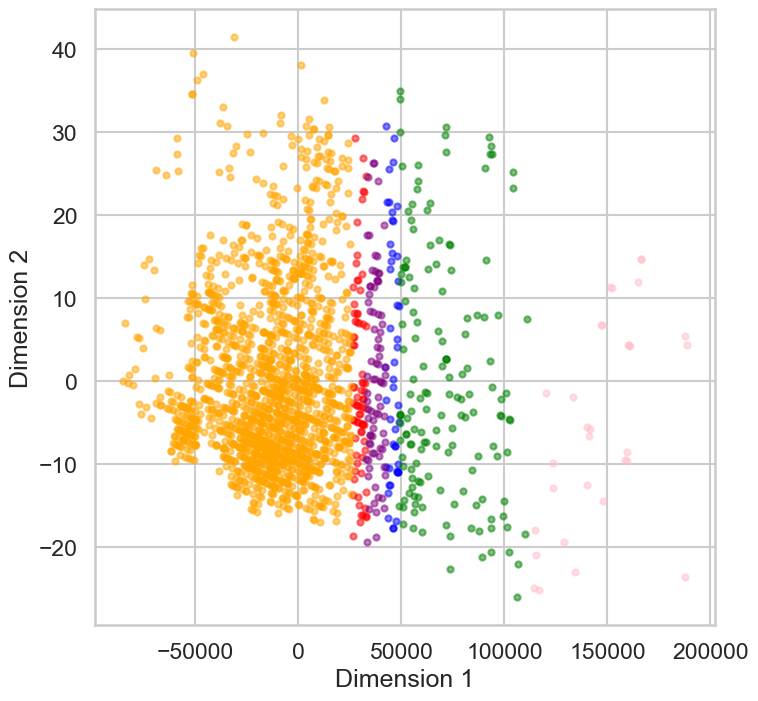

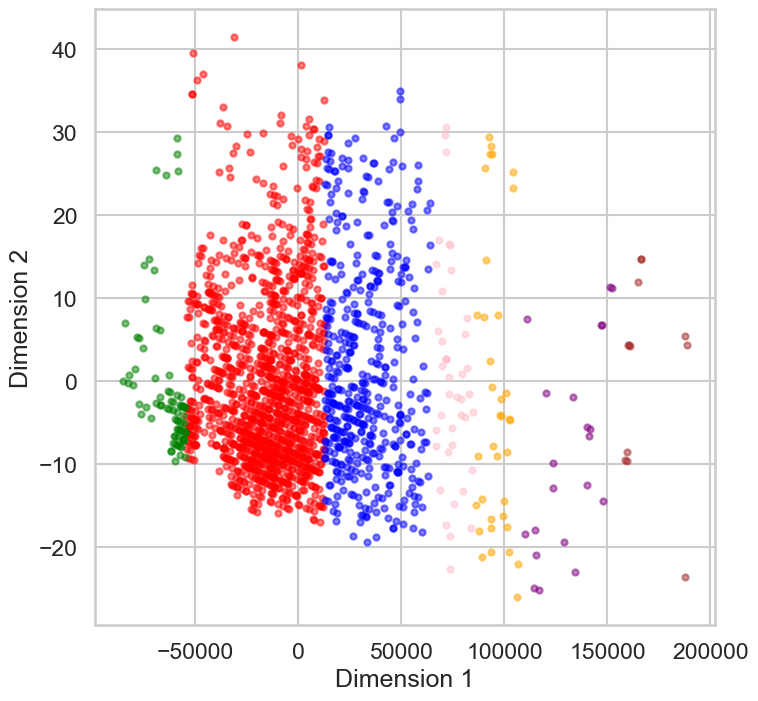

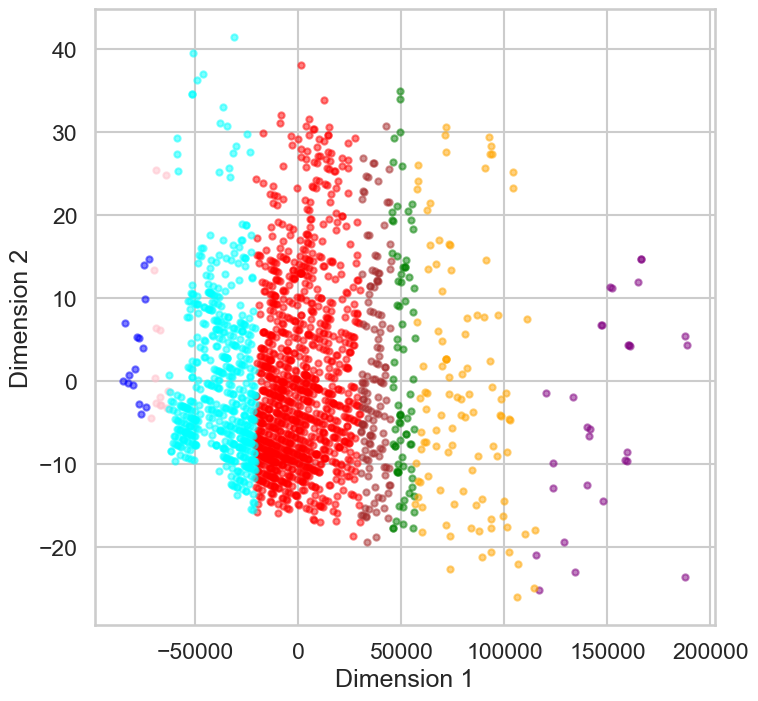

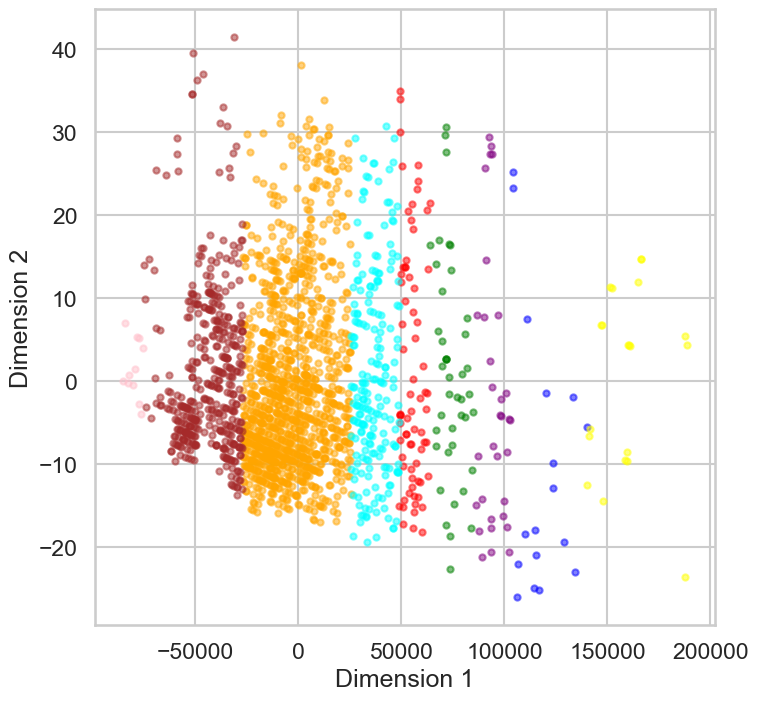

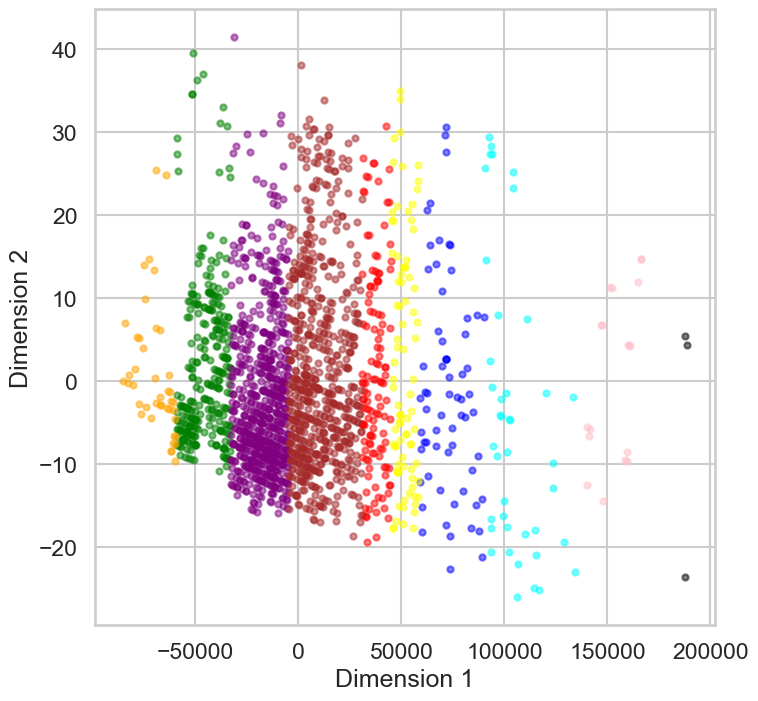

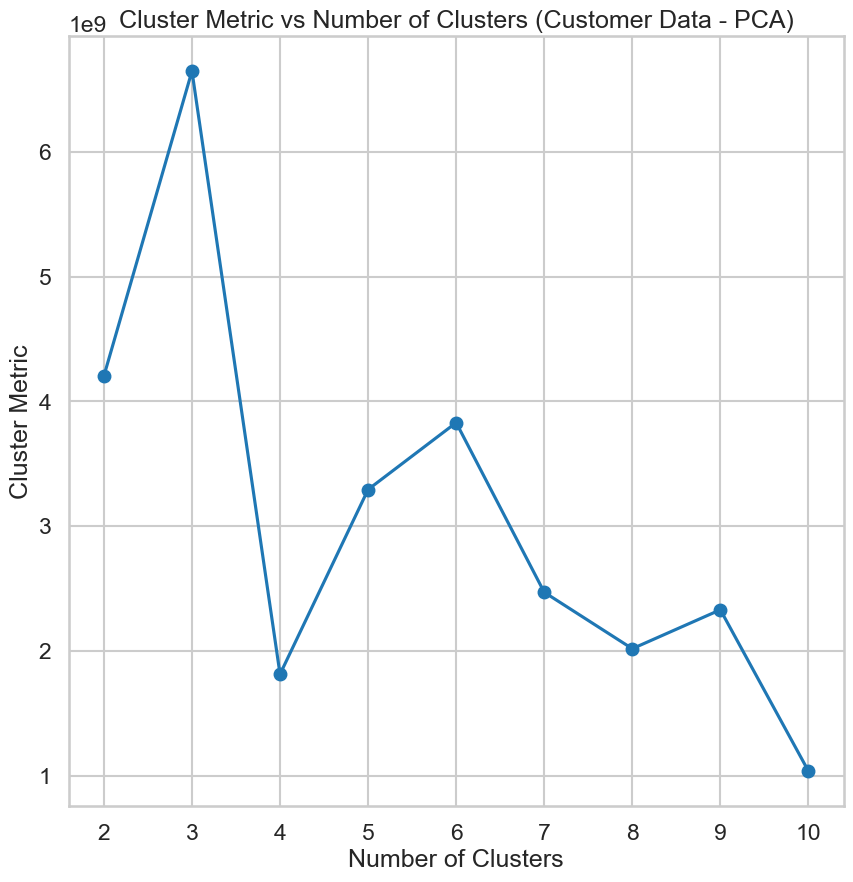

In [44]:
import pandas as pd
from sklearn.decomposition import PCA

# Read the customer dataset from the CSV file
customer_data = pd.read_csv('/Users/maria/Desktop/semster10/ML/ASSIGNM/1/Customer data.csv')

# Extract the feature columns (assuming the first column is the target variable)
X_customer = customer_data.iloc[:, 1:]

# Apply PCA to reduce dimensionality to 2 components
pca = PCA(n_components=2)
X_customer_pca = pca.fit_transform(X_customer)

# Example usage for a 2D PCA-transformed dataset
plt.rcParams['figure.figsize'] = [10, 10]
sns.set_style("whitegrid")
sns.set_context("talk")

# Varying number of clusters from 2 to 10
num_clusters_range = range(2, 11)
cluster_metrics_customer = []

for k in num_clusters_range:
    result_customer = GUC_Kmean(X_customer_pca, Number_of_Clusters=k, Distance_Type='euclidean')
    cluster_metrics_customer.append(result_customer[1])  # Cluster Metric

    # Display and plot (Note: For 2D data only)
    if X_customer_pca.shape[1] == 2:
        display_cluster_multi_dim(X_customer_pca, km=result_customer, num_clusters=k, color_palette=['red', 'blue', 'green', 'purple', 'orange', 'pink', 'brown', 'cyan', 'yellow', 'black'])

plt.show()

# Plot Cluster Metric versus Number of Clusters
plt.figure()
plt.plot(num_clusters_range, cluster_metrics_customer, marker='o')
plt.title('Cluster Metric vs Number of Clusters (Customer Data - PCA)')
plt.xlabel('Number of Clusters')
plt.ylabel('Cluster Metric')
plt.show()


## THIS THE CLUSTERING OF THE DATASET CUSTOMER_DATA BY USING PEARSON DISTANCE

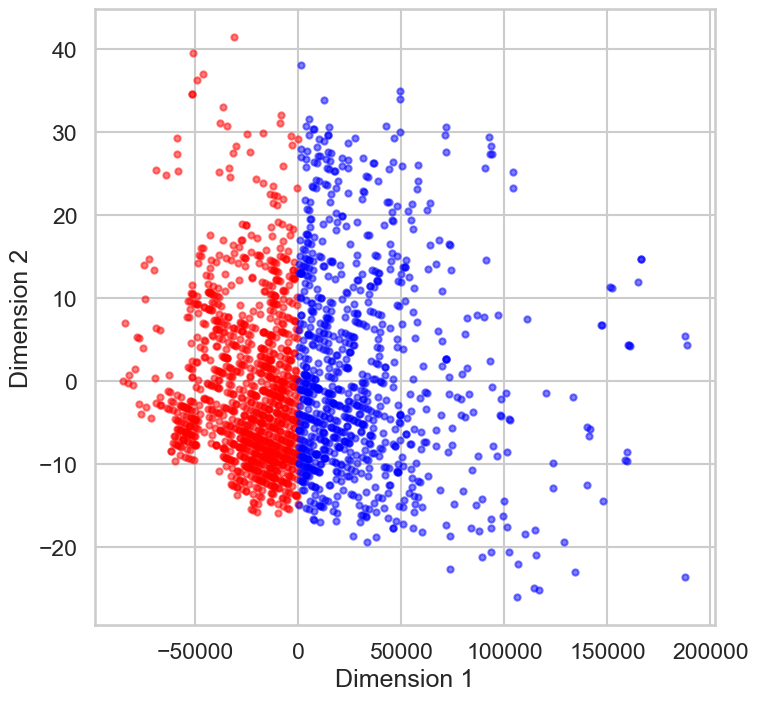

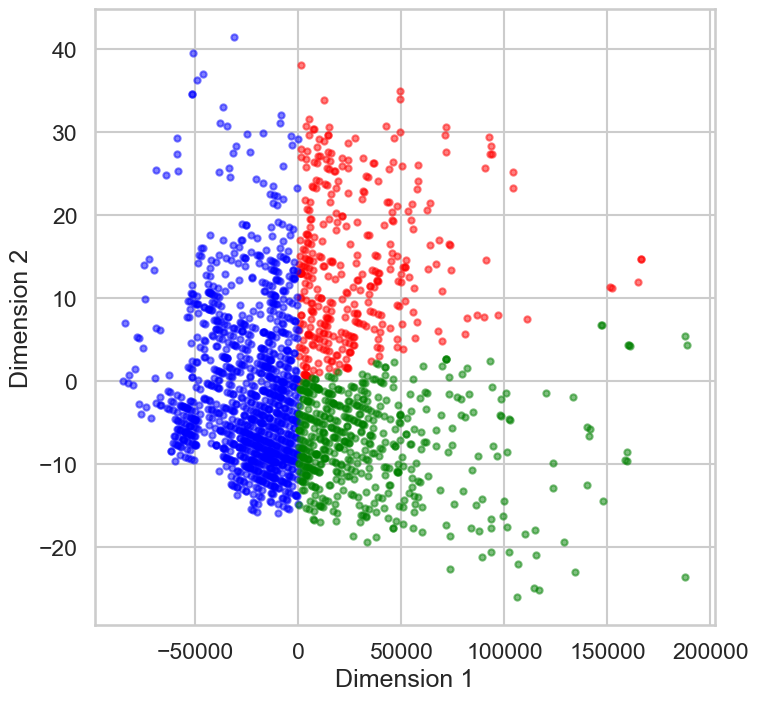

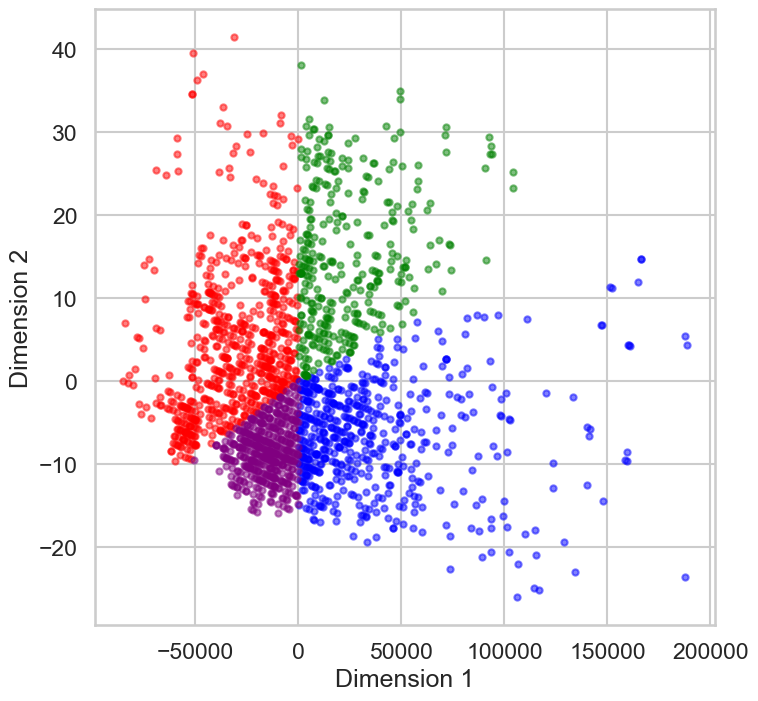

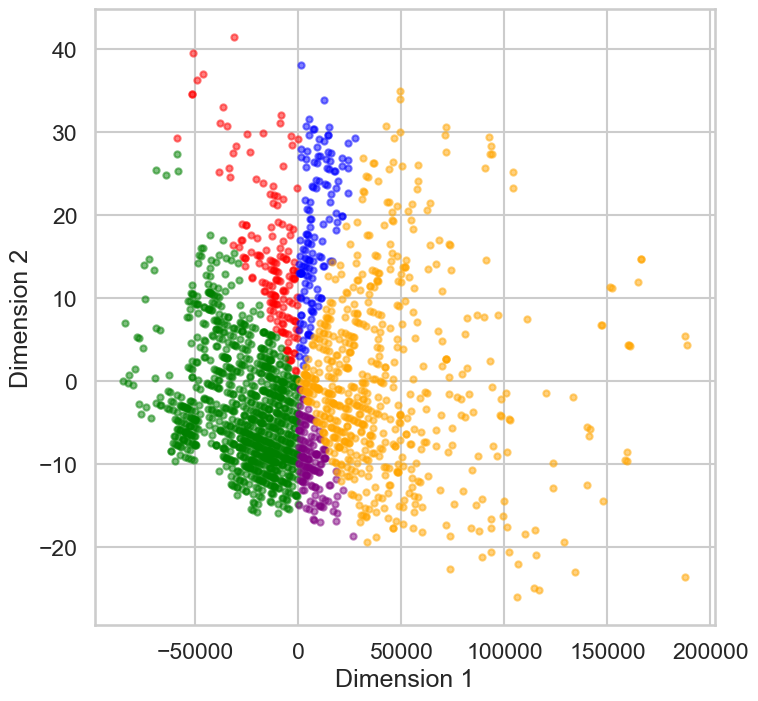

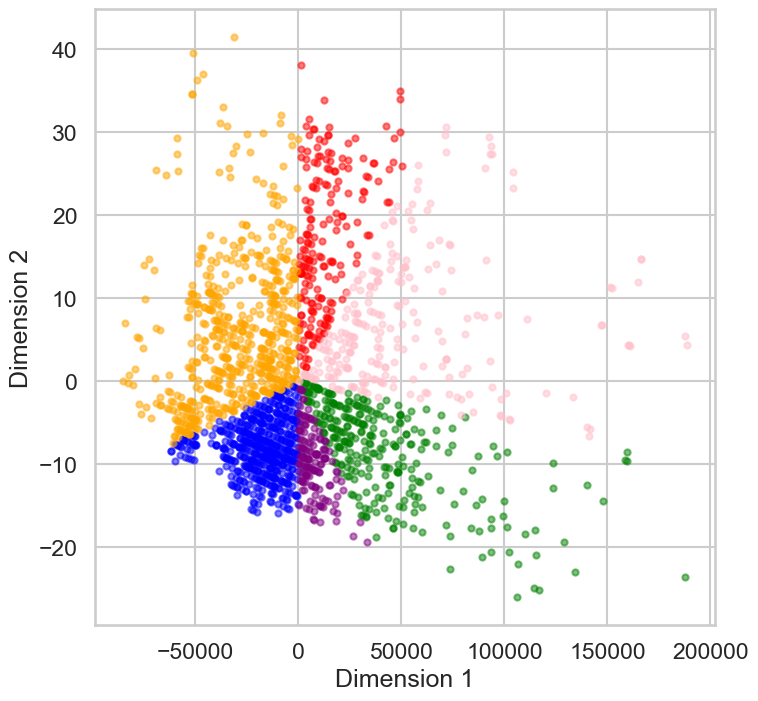

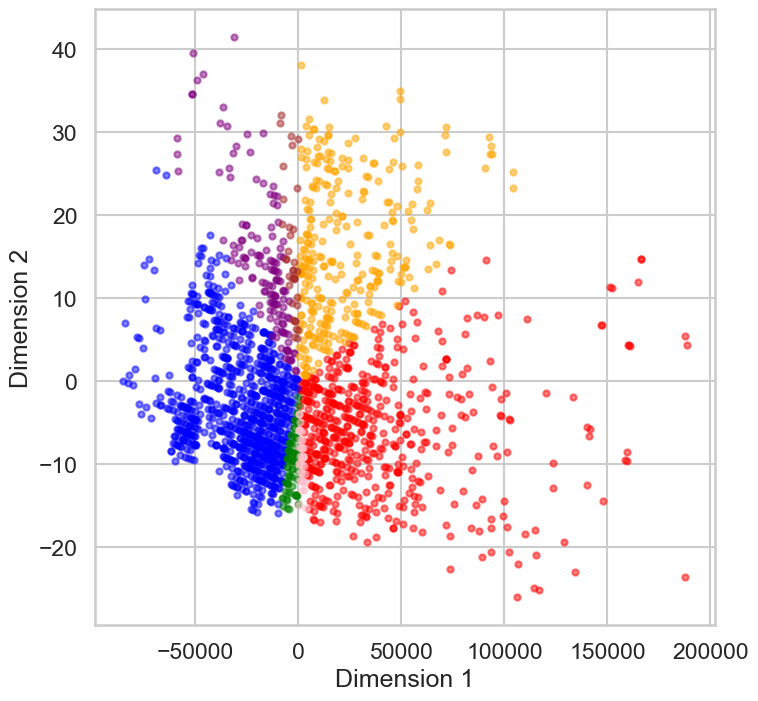

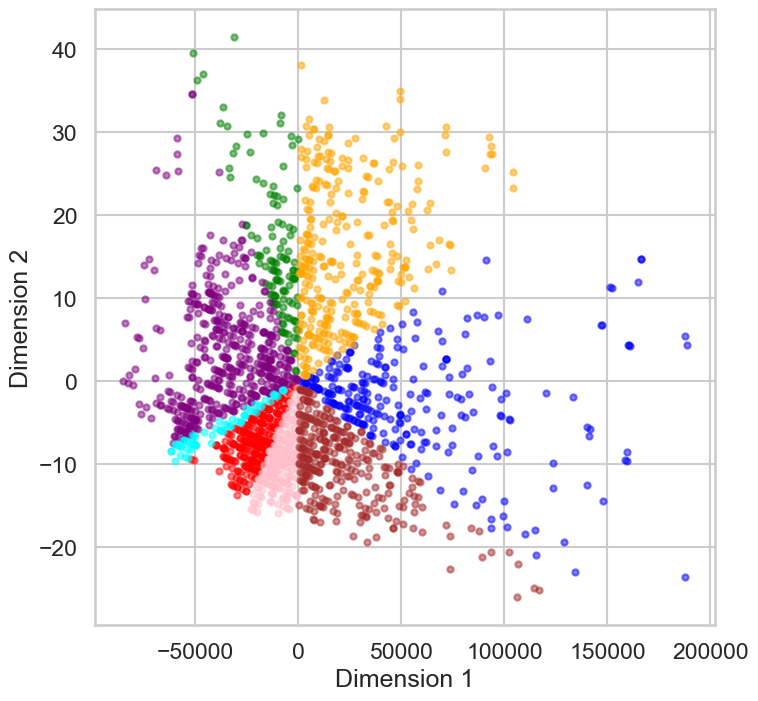

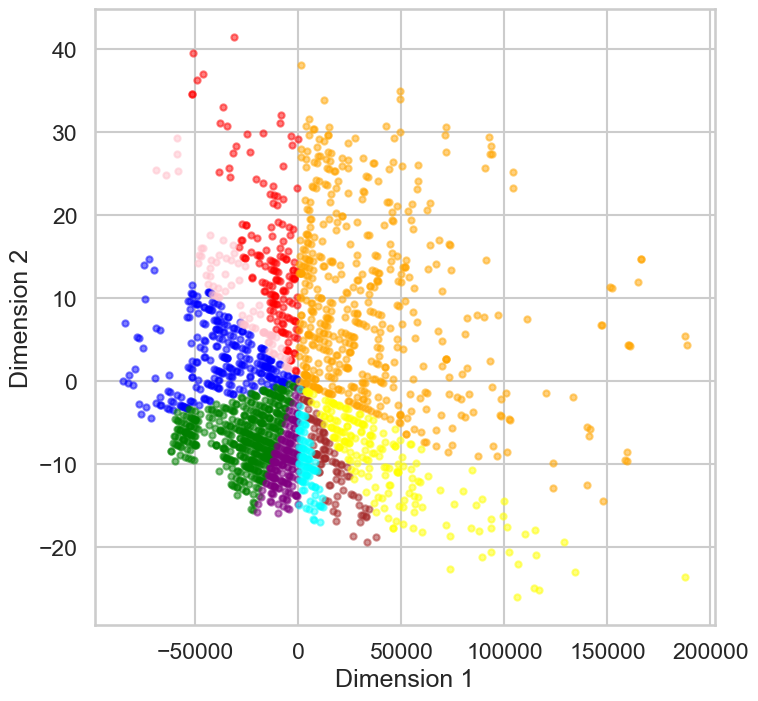

/Users/maria/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/maria/anaconda3/lib/python3.11/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


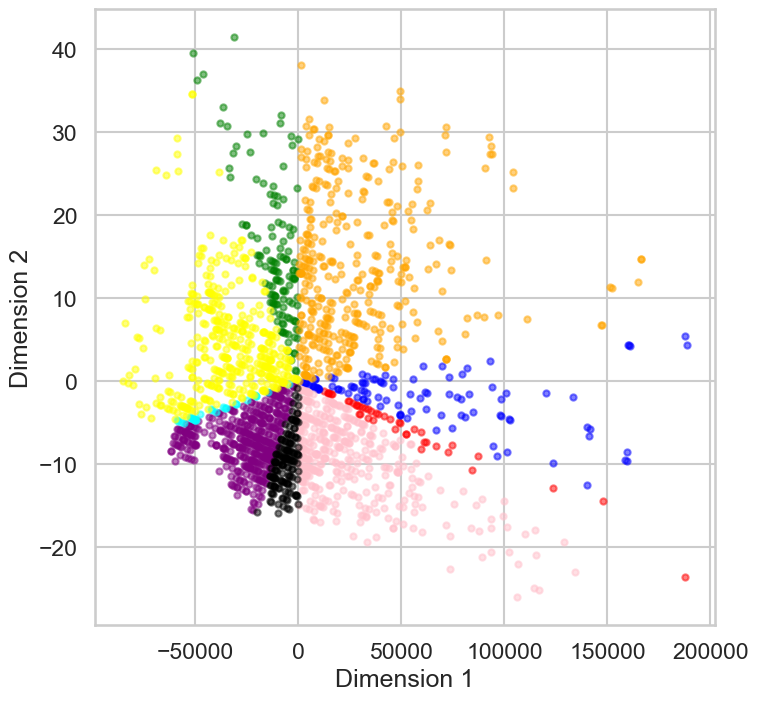

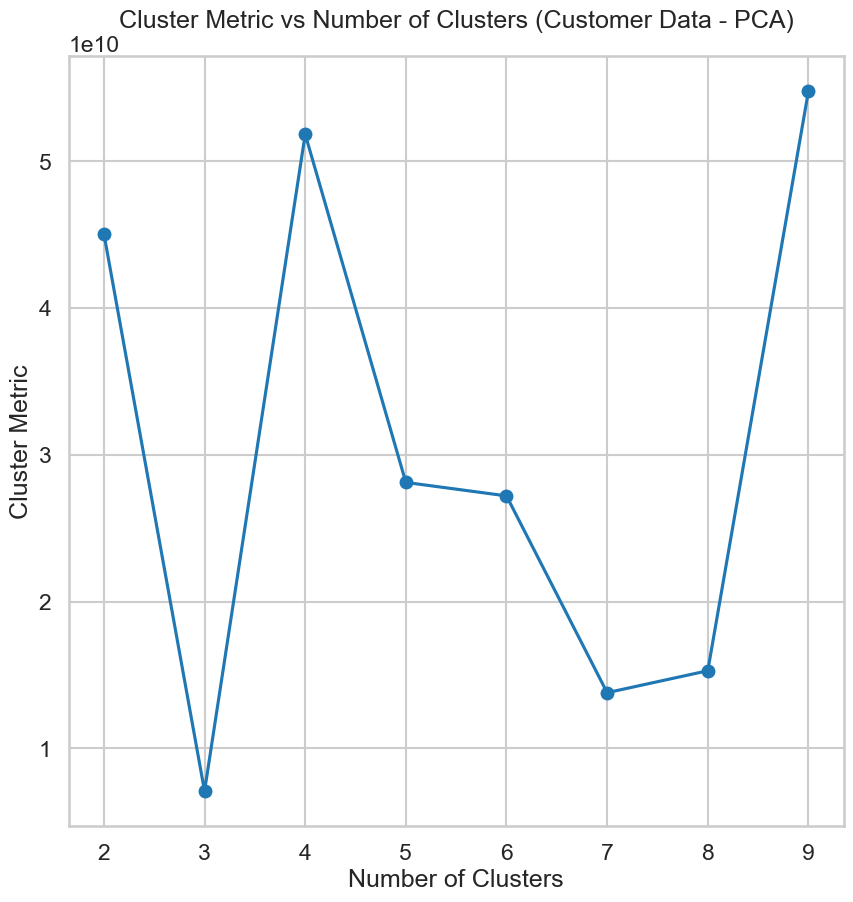

In [51]:
import pandas as pd
from sklearn.decomposition import PCA

# Read the customer dataset from the CSV file
customer_data = pd.read_csv('/Users/maria/Desktop/semster10/ML/ASSIGNM/1/Customer data.csv')

# Extract the feature columns (assuming the first column is the target variable)
X_customer = customer_data.iloc[:, 1:]

# Apply PCA to reduce dimensionality to 2 components
pca = PCA(n_components=2)
X_customer_pca = pca.fit_transform(X_customer)

# Example usage for a 2D PCA-transformed dataset
plt.rcParams['figure.figsize'] = [10, 10]
sns.set_style("whitegrid")
sns.set_context("talk")

# Varying number of clusters from 2 to 10
num_clusters_range = range(2, 11)
cluster_metrics_customer = []

for k in num_clusters_range:
    result_customer = GUC_Kmean(X_customer_pca, Number_of_Clusters=k, Distance_Type='pearson')
    cluster_metrics_customer.append(result_customer[1])  # Cluster Metric

    # Display and plot (Note: For 2D data only)
    if X_customer_pca.shape[1] == 2:
        display_cluster_multi_dim(X_customer_pca, km=result_customer, num_clusters=k, color_palette=['red', 'blue', 'green', 'purple', 'orange', 'pink', 'brown', 'cyan', 'yellow', 'black'])

plt.show()

# Plot Cluster Metric versus Number of Clusters
plt.figure()
plt.plot(num_clusters_range, cluster_metrics_customer, marker='o')
plt.title('Cluster Metric vs Number of Clusters (Customer Data - PCA)')
plt.xlabel('Number of Clusters')
plt.ylabel('Cluster Metric')
plt.show()
